---

> # <center>EDA - VIDEO GAME SALES 🎮</center>

---

> <center><img src="https://giffiles.alphacoders.com/162/162991.gif"></center>

---

---

# Description

><i>This dataset contains a list of video games with sales greater than 100,000 copies. It was generated by a scrape of <a href="https://www.vgchartz.com/"><b>vgchartz.com</b></a></i>.

**Fields include**

   * Name - The games name

   * Platform - Platform of the games release (i.e. PC,PS4, etc.)

   * Year - Year of the game's release

   * Genre - Genre of the game

   * Publisher - Publisher of the game

   * NA_Sales - Sales in North America (in millions)

   * EU_Sales - Sales in Europe (in millions)

   * JP_Sales - Sales in Japan (in millions)

   * Other_Sales - Sales in the rest of the world (in millions)

   * Global_Sales - Total worldwide sales.

><i>The script to scrape the data is available at https://github.com/GregorUT/vgchartzScrape.</i><br>
 <i>It is based on BeautifulSoup using Python.</i><br>
 <i>There are 16,598 records. 2 records were dropped due to incomplete information.</i>

---

# Objective

><i> It is possible to divide <b>data analysis</b> into two fields: Hypothesis Generation and Hypothesis Confirmation (Also called confirmatory analysis). In this <b>project</b> I will deal only with <b>exploratory analysis</b>, where the objective is to understand how the data is distributed and generate insight for future decision-making, this analysis aims to explore as much as possible the data in a simple, intuitive and informative way. The data used in this project contains information only from <b>1980</b> to <b>2016</b>. Below is a sketch of all the stages made in these notebooks, following a logical and intuitive sequence to facilitate the understanding of the data.</i>

---

# Outline

**1. Libraries & Data loading**<br>
A. [Used Libraries](#Bibliotecas)<br>
B. [Database Loading](#dados)<br>
C. [Summary of data](#sumario)<br>

**2. Descriptive Analysis**<br>
A. [Frequency Distribution](freq)<br>
B. [Central Trend Measures](#medidas)<br>
C. [Separating Measures](#mensures)<br>
D. [Dispersion Measures](#dispersao)<br>

**3. Exploratory Analysis**<br>
A. [Analysis of the world's best-selling games](#mais)<br>
B. [Number of Sales per platform](#plataforma)<br>
C. [Game Sales by Genre](#genero)<br>
D. [Number of sales per publisher](#published)<br>
E. [Global Sales Number per Year](#y)<br>

---

---

# 1. Libraries & Data loading <br>

## A. Used Libraries

<a id="Bibliotecas"></a>

In [62]:
# Visualizations
library(hrbrthemes)
library(gganimate)
library(gapminder)
library(babynames)
library(ggthemes)
library(cowplot)
library(ggplot2)

# Data Manipulation
library(dplyr)

# Statistics
library(DescTools)

## B. Database Loading

<b><font color = "red">Note:</font></b>
    
><i> In this work, as you can see in the code below, I removed a total of <b>271</b> records with invalid values / NaN in the <b>Year</b> column and <b>4</b> records whose three of them it was from <b>2017</b> and one from <b>2020</b>. As described above I will analyze only the data that are in the year range from <b>1980</b> to <b>2016</b></i>

<a id="dados"></a>

In [63]:
# Loading the database 
data <- read.csv("../input/videogamesales/vgsales.csv", stringsAsFactors = FALSE)

# Removing the Rank column
data$Rank <- NULL

# Filtering only the records of interest for this study, removing the records with Year = NaN and records with the year above 2016
data <- data[data$Year != "N/A" & data$Year != "2017" & data$Year != "2020", ]
data$Year <- factor(data$Year)

# Viewing the first 6 DataFrame records
head(data, 6)

,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
,<chr>,<chr>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
6,Tetris,GB,1989,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26


## C. Summary of data

<a id="sumario"></a>

In [64]:
summary(data)

     Name             Platform              Year         Genre          
 Length:16323       Length:16323       2009   :1431   Length:16323      
 Class :character   Class :character   2008   :1428   Class :character  
 Mode  :character   Mode  :character   2010   :1259   Mode  :character  
                                       2007   :1202                     
                                       2011   :1139                     
                                       2006   :1008                     
                                       (Other):8856                     
  Publisher            NA_Sales          EU_Sales          JP_Sales       
 Length:16323       Min.   : 0.0000   Min.   : 0.0000   Min.   : 0.00000  
 Class :character   1st Qu.: 0.0000   1st Qu.: 0.0000   1st Qu.: 0.00000  
 Mode  :character   Median : 0.0800   Median : 0.0200   Median : 0.00000  
                    Mean   : 0.2655   Mean   : 0.1476   Mean   : 0.07868  
                    3rd Qu.: 0.2400   3rd

---

# 2. Descriptive Analysis

><i> <b>Descriptive statistics</b> is a scope of statistics that applies various techniques to describe and summarize any data set and studies the general behavior of the observed data, in order to facilitate problem solving. This can be done through <b>frequency tables</b>, <b>graphs</b> and <b>measures of central tendency</b>, such as <b>mean</b>, <b>median</b>, <b>mode</b>, <b>dispersion measures</b> such as <b>standard deviation</b>, <b>percentiles</b> and <b>quartiles</b>.</i>

---
<b><font color = "red">Observação:</font></b>

> The technique used to create the Percent column uses the following formula:

p -> Percent

Freq_x -> Frequency of an element x

$\sum_{i=0}^{n}(Freq_i)$ -> Sum of all frequencies

    
---

> ## $p = 100 * \frac{Freq_x}{\sum_{i=0}^{n}(Freq_i)}$

---


---

> <center><img src="https://apicesistemasdeenergia.com.br/wp-content/uploads/2018/01/An%C3%A1lise-de-Dados-Conceito-1200x480.jpg"></center>

---

---

## A. Frequency Distribution

><i> The first step in an analysis work is the knowledge of the behavior of the variables involved in the study. Using statistical techniques such as <b>frequency tables</b>, <b>histograms</b> and <b>bar graphs</b> we can better understand the way in which the phenomena under study are distributed.</i>



<a id = "freq"></a>

### Distribution of quantitative variables

<b><font color = "red">Note:</font></b>

><i> Quantitative variables are characteristics that can be measured on a quantitative scale, that is, they have numerical values that make sense, for example: <b>Height</b>, <b>Income</b>, <b>Weight</b> and <b>Age</b>. And they can be <b>Discrete</b> or <b>Continuous</b>.
</i>

**Discreet**

><i>Variables are classified as <b>discrete quantitative</b> when the set of possible results is finite or enumeral, as an example: <b>Age</b>, <b>Number of Children</b> and <b>students at a school</b>.</i>

**Continuous**

><i> Variables are classified as <b>continuous quantitative</b> when the values are expressed as a range or union of real numbers, such as: <b>Height</b>, <b>Mass</b> and <b>Blood sugar level </b> </i>.

---

><i> The variables that belong to the quantitative category are: <b>Year</b>, <b>NA_Sales</b>, <b>EU_Sales</b>, <b>JP_Sales</b>, <b>Other_Sales</b> and <b>Golbal_Sales</b></i>

---

---

#### Year

<div class="alert alert-block alert-warning"> 
<p>Year -> Year of the game's release</p>
</div>

In [65]:
freq_year <- data.frame(cbind(Frequency = table(data$Year), Percent = prop.table(table(data$Year)) * 100))
freq_year <- freq_year[order(freq_year$Frequency, decreasing=TRUE), ]
freq_year

,Frequency,Percent
,<dbl>,<dbl>
2009,1431,8.76677081
2008,1428,8.74839184
2010,1259,7.71304295
2007,1202,7.36384243
2011,1139,6.97788397
2006,1008,6.17533542
2005,941,5.76487165
2002,829,5.07872327
2003,775,4.74790173


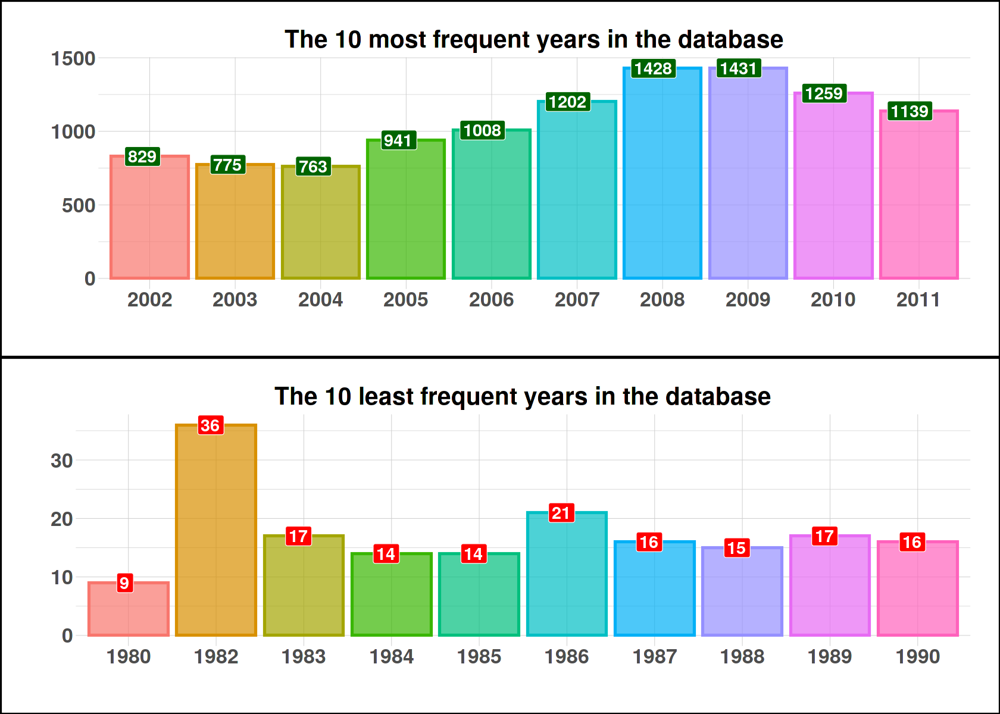

In [66]:
options(repr.plot.width = 14, repr.plot.height = 10)

df <- head(freq_year, 10)
a <- ggplot(data = df, mapping = aes(x = Frequency, y = row.names(df))) +
         geom_bar(stat = "identity", mapping = aes(fill = row.names(df), color = row.names(df)), alpha = .7, size = 1.1) +
         geom_label(mapping = aes(label=Frequency), fill = "#006400", size = 6, color = "white", fontface = "bold", hjust=.7) +
         ggtitle("The 10 most frequent years in the database") +
         xlab(" ") +
         ylab("") +
         theme_ipsum() +
         coord_flip() +
         theme(plot.background = element_rect(color = "black", size = 1.1),
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

df1 <- tail(freq_year, 10)
b <- ggplot(data = df1, mapping = aes(x = Frequency, y = row.names(df1))) +
         geom_bar(stat = "identity", mapping = aes(fill = row.names(df1), color = row.names(df1)), alpha = .7, size = 1.1) +
         geom_label(mapping = aes(label=Frequency), fill = "red", size = 6, color = "white", fontface = "bold", hjust=.7) +
         ggtitle("The 10 least frequent years in the database") +
         xlab(" ") +
         ylab("") +
         theme_ipsum() +
         coord_flip() +
         theme(plot.background = element_rect(color = "black", size = 1.1),
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, nrow = 2, ncol = 1)

---

> ##### | The most frequent 5 years | The least frequent 5 years |

---

| <b>2009</b> - <font color = "green"><b>8.76%</b></font> | <b>1980</b> - <font color = "green"><b>0.05%</b></font> |<br>
| <b>2008</b> - <font color = "green"><b>8.74%</b></font> | <b>1985</b> - <font color = "green"><b>0.08%</b></font> |<br>
| <b>2010</b> - <font color = "green"><b>7.71%</b></font> | <b>1984</b> - <font color = "green"><b>0.08%</b></font> |<br>
| <b>2007</b> - <font color = "green"><b>7.36%</b></font> | <b>1988</b> - <font color = "green"><b>0.09%</b></font> |<br>
| <b>2011</b> - <font color = "green"><b>6.97%</b></font> | <b>1990</b> - <font color = "green"><b>0.09%</b></font> |<br> 
   
---

#### NA_Sales

<div class="alert alert-block alert-warning"> 
<p>NA_Sales -> Sales in North America (in millions)</p>
</div>

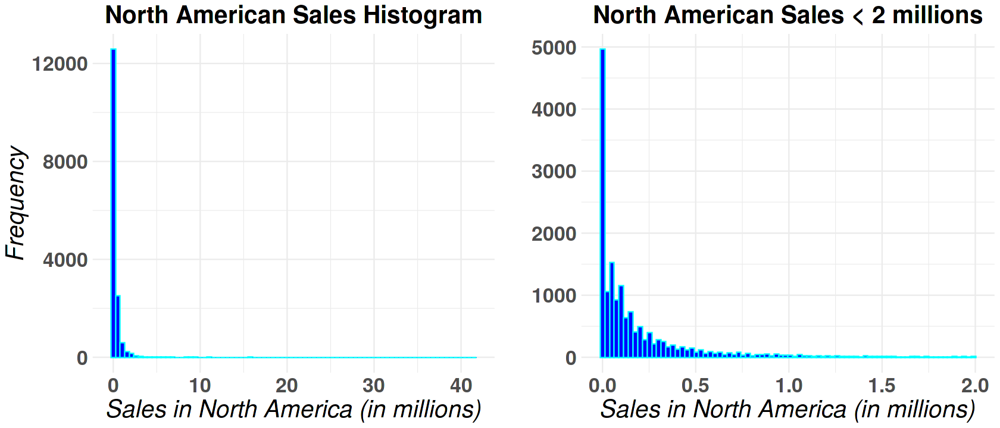

In [67]:
options(repr.plot.width = 14, repr.plot.height = 6)
a <- ggplot(data = data, mapping = aes(x = NA_Sales)) +
         geom_histogram(bins = 80, fill = "blue", color = "cyan") +
         xlab("Sales in North America (in millions)") +
         ylab("Frequency") +
         ggtitle("North American Sales Histogram") +
         theme_minimal() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

df <- data[data$NA_Sales < 2, ]
b <- ggplot(data = df, mapping = aes(x = NA_Sales)) +
         geom_histogram(bins = 80, fill = "blue", color = "cyan") +
         xlab("Sales in North America (in millions)") +
         ylab("") +
         ggtitle("North American Sales < 2 millions") +
         theme_minimal() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, nrow = 1, ncol = 2)

#### EU_Sales

<div class="alert alert-block alert-warning"> 
<p>EU_Sales -> Sales in Europe (in millions)</p>
</div>

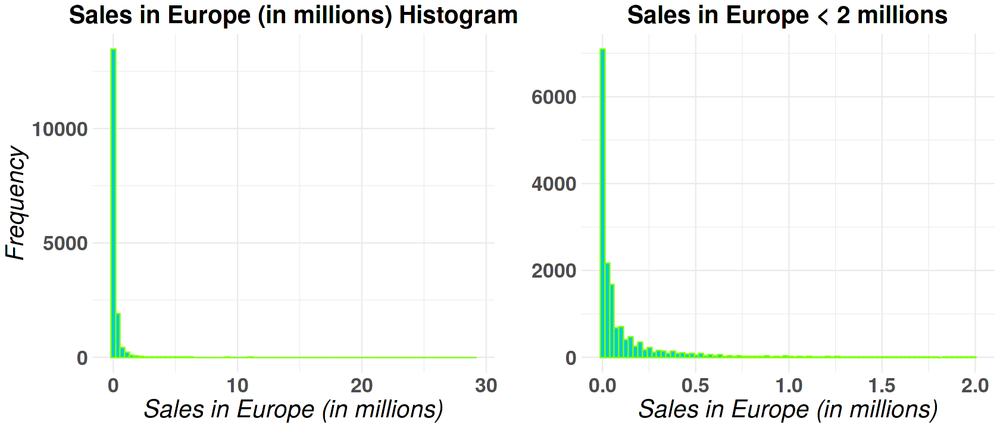

In [68]:
options(repr.plot.width = 14, repr.plot.height = 6)
a <- ggplot(data = data, mapping = aes(x = EU_Sales)) +
         geom_histogram(bins = 80, fill = "#00CED1", color = "#7FFF00") +
         xlab("Sales in Europe (in millions)") +
         ylab("Frequency") +
         ggtitle("Sales in Europe (in millions) Histogram") +
         theme_minimal() +
         theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

df <- data[data$EU_Sales < 2, ]
b <- ggplot(data = df, mapping = aes(x = EU_Sales)) +
         geom_histogram(bins = 80, fill = "#00CED1", color = "#7FFF00") +
         xlab("Sales in Europe (in millions)") +
         ylab("") +
         ggtitle("Sales in Europe < 2 millions") +
         theme_minimal() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, nrow = 1, ncol = 2)

#### JP_Sales

<div class="alert alert-block alert-warning"> 
<p>JP_Sales -> Sales in Japan (in millions)</p>
</div>

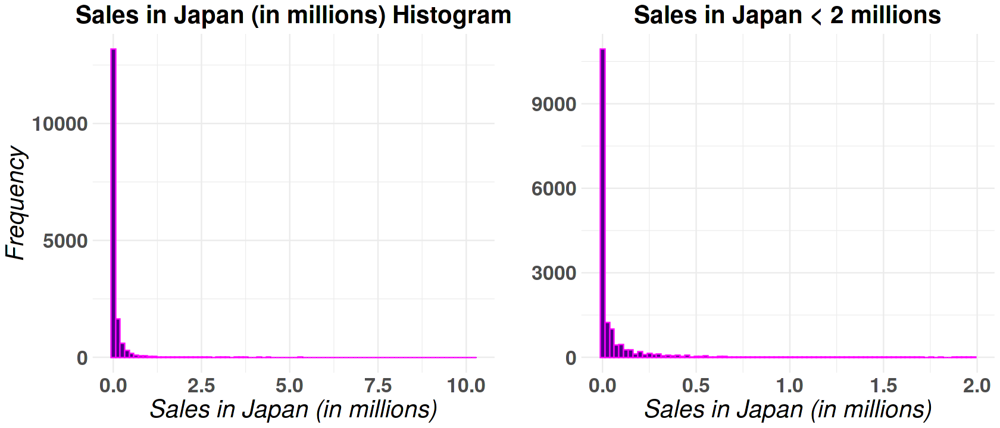

In [69]:
options(repr.plot.width = 14, repr.plot.height = 6)
a <- ggplot(data = data, mapping = aes(x = JP_Sales)) +
         geom_histogram(bins = 80, fill = "#4B0082", color = "#FF00FF") +
         xlab("Sales in Japan (in millions)") +
         ylab("Frequency") +
         ggtitle("Sales in Japan (in millions) Histogram") +
         theme_minimal() +
         theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

df <- data[data$JP_Sales < 2, ]
b <- ggplot(data = df, mapping = aes(x = JP_Sales)) +
         geom_histogram(bins = 80, fill = "#4B0082", color = "#FF00FF") +
         xlab("Sales in Japan (in millions)") +
         ylab("") +
         ggtitle("Sales in Japan < 2 millions") +
         theme_minimal() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, nrow = 1, ncol = 2)

#### Other_Sales

<div class="alert alert-block alert-warning"> 
<p>Other_Sales -> Sales in the rest of the world (in millions)</p>
</div>

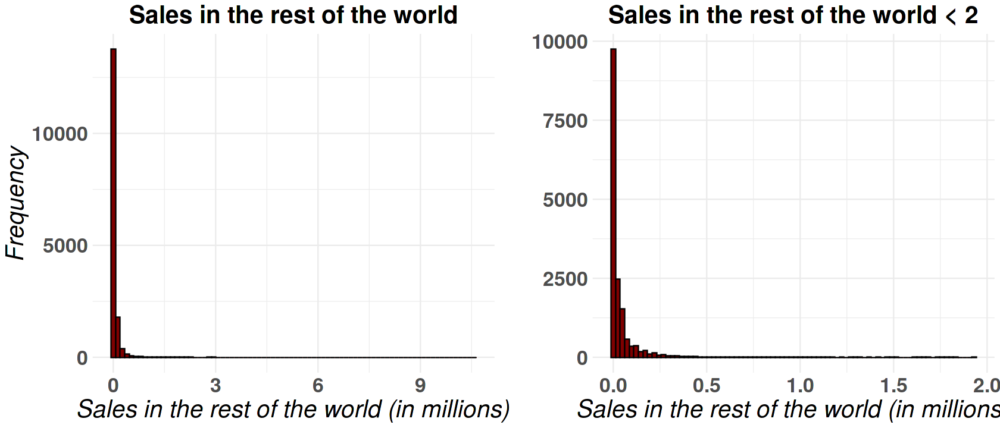

In [70]:
options(repr.plot.width = 14, repr.plot.height = 6)
a <- ggplot(data = data, mapping = aes(x = Other_Sales)) +
         geom_histogram(bins = 80, fill = "#800000", color = "black") +
         xlab("Sales in the rest of the world (in millions)") +
         ylab("Frequency") +
         ggtitle("Sales in the rest of the world") +
         theme_minimal() +
         theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

df <- data[data$Other_Sales < 2, ]
b <- ggplot(data = df, mapping = aes(x = Other_Sales)) +
         geom_histogram(bins = 80, fill = "#800000", color = "black") +
         xlab("Sales in the rest of the world (in millions)") +
         ylab("") +
         ggtitle("Sales in the rest of the world < 2") +
         theme_minimal() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, nrow = 1, ncol = 2)

#### Global_Sales

<div class="alert alert-block alert-warning"> 
<p>Global_Sales -> Total worldwide sales</p>
</div>

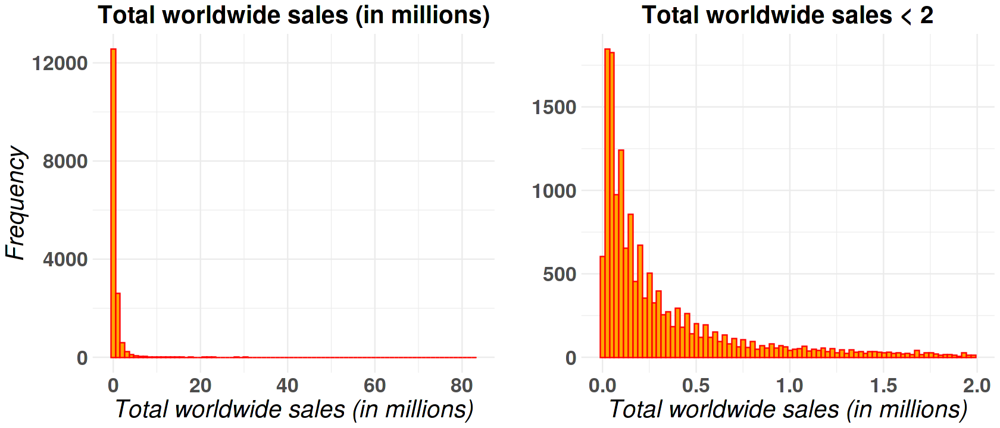

In [71]:
options(repr.plot.width = 14, repr.plot.height = 6)
a <- ggplot(data = data, mapping = aes(x = Global_Sales)) +
         geom_histogram(bins = 80, fill = "orange", color = "#FF0000") +
         xlab("Total worldwide sales (in millions)") +
         ylab("Frequency") +
         ggtitle("Total worldwide sales (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

df <- data[data$Global_Sales < 2, ]
b <- ggplot(data = df, mapping = aes(x = Global_Sales)) +
         geom_histogram(bins = 80, fill = "orange", color = "#FF0000") +
         xlab("Total worldwide sales (in millions)") +
         ylab("") +
         ggtitle("Total worldwide sales < 2") +
         theme_minimal() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, nrow = 1, ncol = 2)

><i> With these graphical analysis we can overlook that the sales of video games is mostly below 2 million dollars.</i>

---

### Distribution of qualitative variables

<b><font color = "red">Note:</font></b>


><i> Qualitative variables are characteristics that cannot be measured numerically, such as: <b>Sex</b>, <b>Color</b>, <b>Education</b> and <b>Social Class</b>. And they can be <b>nominal</b> or <b>ordinal</b>.</i>


**Nominal:**

><i> Nominal qualitative variables are the characteristics of a database that do not rank among their categorical ones, such as: <b>Color</b> and <b>Sex</b>.</i>

**Ordinal**

><i> Variables are classified as qualitative ordinal when the categories can be ordered among themselves, such as: <b>Social Classes</b> and <b>Education Level</b>.</i>
    
---

<center><img src = "https://www.sunshinemaths.com/wp-content/uploads/types%20of%20data(1).jpg"></center>
    
---

><i> The variables classified as qualitative of the data set under study are: Name, Platform, Genre and Publisher.</i>
    
---

#### Name

<div class="alert alert-block alert-warning"> 
<p>Name -> The games name</p>
</div>

#### The 5 most frequent games in the database

In [72]:
freq_name <- data.frame(cbind(Frequency = table(data$Name), Percent = prop.table(table(data$Name)) * 100))
freq_name <- head(freq_name[order(freq_name$Frequency, decreasing = T), ], 5)
freq_name

,Frequency,Percent
,<dbl>,<dbl>
Need for Speed: Most Wanted,12,0.07351590
FIFA 14,9,0.05513692
LEGO Marvel Super Heroes,9,0.05513692
Ratatouille,9,0.05513692
Angry Birds Star Wars,8,0.04901060


---

<center><img src = "https://uploaddeimagens.com.br/images/002/724/400/full/Bank_Credit_Card_Process_Flow_%281%29.png?1592946837"></center>

---

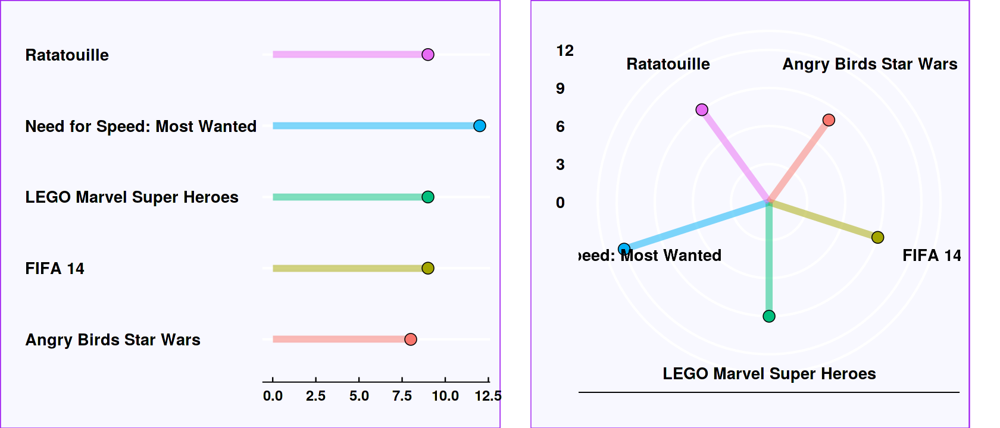

In [73]:
a <- ggplot(data = freq_name, mapping = aes(x = row.names(freq_name), y = Frequency)) +
         geom_segment(aes(xend=row.names(freq_name), yend=0, color = row.names(freq_name)), size = 2.5, alpha = .5) +
         geom_point(mapping = aes(fill = row.names(freq_name)), size = 5, shape = 21) +
         coord_flip() +
         theme_economist() +
         xlab("") +
         ylab("") +
         theme(plot.background = element_rect(fill = "#F8F8FF", color = "purple"),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 14, face = "bold"),
               axis.text.y = element_text(size = 16, face = "bold"),
               legend.position = "none")

b <- ggplot(data = freq_name, mapping = aes(x = row.names(freq_name), y = Frequency)) +
         geom_segment(aes(xend=row.names(freq_name), yend=0, color = row.names(freq_name)), size = 2.5, alpha = .5) +
         geom_point(mapping = aes(fill = row.names(freq_name)), size = 5, shape = 21) +
         theme_economist() +
         xlab("") +
         ylab("") +
         theme(plot.background = element_rect(fill = "#F8F8FF", color = "purple"),
               axis.title.x = element_text(size = 16, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 16, face = "bold"),
               axis.text.y = element_text(size = 16, face = "bold"),
               legend.position = "none")

plot_grid(a, b + coord_polar(), ncol = 2, nrow = 1)

#### Platform

<div class="alert alert-block alert-warning"> 
<p>Platform -> Platform of the games release (i.e. PC,PS4, etc.)</p>
</div>

In [74]:
unique(data$Platform)

[1] "Wii"  "NES"  "GB"   "DS"   "X360" "PS3"  "PS2"  "SNES" "GBA"  "3DS" 
[11] "PS4"  "N64"  "PS"   "XB"   "PC"   "2600" "PSP"  "XOne" "GC"   "WiiU"
[21] "GEN"  "DC"   "PSV"  "SAT"  "SCD"  "WS"   "NG"   "TG16" "3DO"  "GG"  
[31] "PCFX"

#### The 5 most frequent gaming platforms in the database

In [75]:
freq_platform <- data.frame(cbind(Frequency = table(data$Platform), Percent = prop.table(table(data$Platform)) * 100))
freq_platform <- head(freq_platform[order(freq_platform$Frequency, decreasing = T), ], 5)
freq_platform

,Frequency,Percent
,<dbl>,<dbl>
DS,2132,13.061325
PS2,2127,13.030693
PS3,1304,7.988728
Wii,1290,7.902959
X360,1235,7.566011


---

<center><img src = "https://uploaddeimagens.com.br/images/002/724/493/full/2.png?1592949029"></center>

---

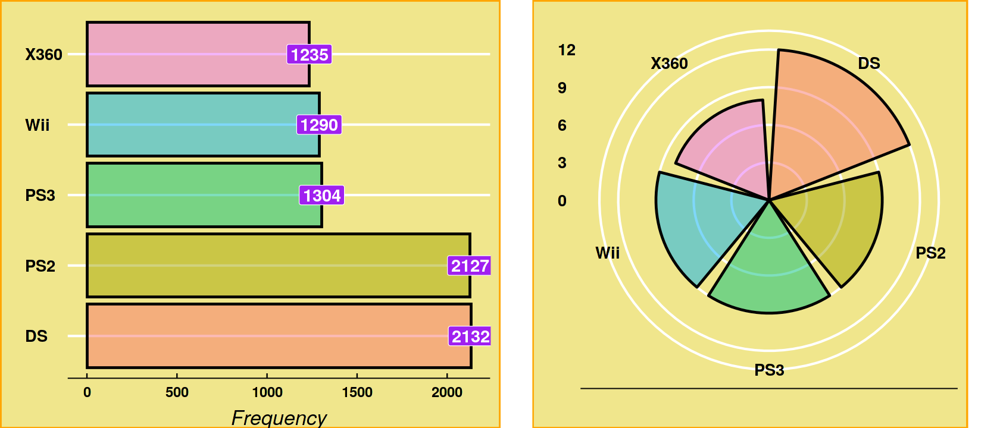

In [76]:
a <- ggplot(data = freq_platform, mapping = aes(x = row.names(freq_platform), y = Frequency)) +
         geom_bar(stat = "identity", aes(fill = row.names(freq_platform)), size = 1, alpha = .5, color = "black") +
         geom_label(mapping = aes(label = Frequency), fill = "purple", color = "white", size = 6, fontface = "bold") +
         coord_flip() +
         theme_economist() +
         ylab("Frequency") +
         xlab("") +
         theme(plot.background = element_rect(fill = "#F0E68C", color = "orange", size = 1),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.x = element_text(size = 20, hjust = .5, vjust = -2, face = "italic"),
               axis.text.x = element_text(size = 14, face = "bold"),
               axis.text.y = element_text(size = 16, face = "bold"),
               legend.position = "none")

b <- ggplot(data = freq_name, mapping = aes(x = row.names(freq_platform), y = Frequency)) +
         geom_bar(stat = "identity", aes(fill = row.names(freq_platform)), color = "black", size = 1, alpha = .5) +
         theme_economist() +
         xlab("") +
         ylab("") +
         theme(plot.background = element_rect(fill = "#F0E68C", color = "orange", size = 1),
               axis.title.y = element_text(size = 16, face = "italic"),
               axis.title.x = element_text(size = 20, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 16, face = "bold"),
               axis.text.y = element_text(size = 16, face = "bold"),
               legend.position = "none")

plot_grid(a, b + coord_polar(), ncol = 2, nrow = 1)

#### Genre

<div class="alert alert-block alert-warning"> 
<p>Genre -> Genre of the game</p>
</div>

---

><i> <b>Electronic games</b> have several variations and subspecies, their categorization may vary according to the aspects to be differentiated. <b>Electronic games</b> also include computer programs, which do not just use the video game console as a support to function.</i>

In [77]:
freq_genre <- data.frame(cbind(Frequency = table(data$Genre), Percent = prop.table(table(data$Genre)) * 100))
freq_genre <- freq_genre[order(freq_genre$Frequency, decreasing = T), ]
freq_genre

,Frequency,Percent
,<dbl>,<dbl>
Action,3252,19.922808
Sports,2304,14.115052
Misc,1710,10.476015
Role-Playing,1469,8.999571
Shooter,1282,7.853948
Adventure,1276,7.817190
Racing,1226,7.510874
Platform,876,5.366661
Simulation,850,5.207376


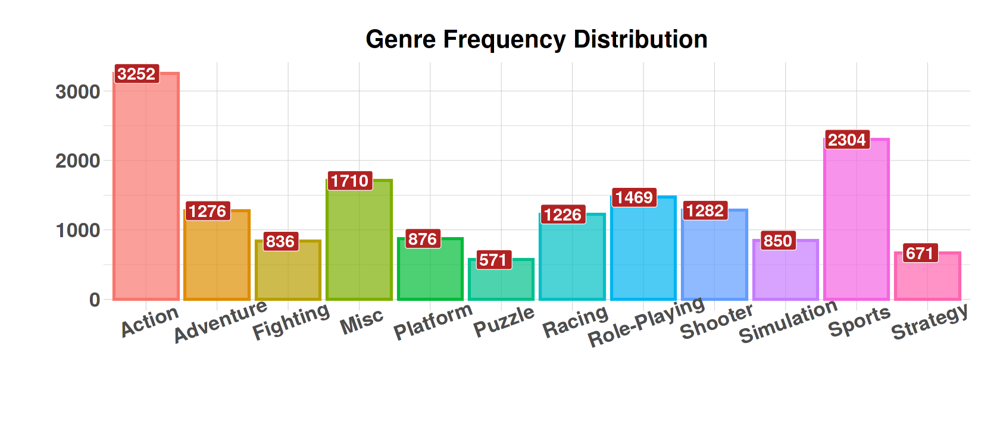

In [78]:
options(repr.plot.width = 14, repr.plot.height = 6)
ggplot(data = freq_genre, mapping = aes(x = Frequency, y = row.names(freq_genre))) +
         geom_bar(stat = "identity", mapping = aes(fill = row.names(freq_genre), color = row.names(freq_genre)), alpha = .7, size = 1.1) +
         geom_label(mapping = aes(label=Frequency), fill = "#B22222", size = 6, color = "white", fontface = "bold", hjust=.7) +
         ggtitle("Genre Frequency Distribution") +
         xlab(" ") +
         ylab("") +
         theme_ipsum() +
         coord_flip() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 20),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

#### Publisher

<div class="alert alert-block alert-warning"> 
<p>Publisher -> Publisher of the game</p>
</div>

---

><i>An <b>publisher of electronic games</b> is a company that publishes electronic games that they initially produced or that were produced by an electronic game developer and are responsible for the manufacture and marketing of the game.</i>

In [79]:
unique(data$Publisher)

[1] "Nintendo"                              
  [2] "Microsoft Game Studios"                
  [3] "Take-Two Interactive"                  
  [4] "Sony Computer Entertainment"           
  [5] "Activision"                            
  [6] "Ubisoft"                               
  [7] "Bethesda Softworks"                    
  [8] "Electronic Arts"                       
  [9] "Sega"                                  
 [10] "SquareSoft"                            
 [11] "Atari"                                 
 [12] "505 Games"                             
 [13] "Capcom"                                
 [14] "GT Interactive"                        
 [15] "Konami Digital Entertainment"          
 [16] "Sony Computer Entertainment Europe"    
 [17] "Square Enix"                           
 [18] "LucasArts"                             
 [19] "Virgin Interactive"                    
 [20] "Warner Bros. Interactive Entertainment"
 [21] "Universal Interactive"                 
 [22] "Eidos Interactive"                     
 [23] "RedOctane"                             
 [24] "Vivendi Games"                         
 [25] "Enix Corporation"                      
 [26] "Namco Bandai Games"                    
 [27] "Palcom"                                
 [28] "Hasbro Interactive"                    
 [29] "THQ"                                   
 [30] "Fox Interactive"                       
 [31] "Acclaim Entertainment"                 
 [32] "MTV Games"                             
 [33] "Disney Interactive Studios"            
 [34] "Majesco Entertainment"                 
 [35] "Codemasters"                           
 [36] "Red Orb"                               
 [37] "Level 5"                               
 [38] "Arena Entertainment"                   
 [39] "Midway Games"                          
 [40] "JVC"                                   
 [41] "Deep Silver"                           
 [42] "989 Studios"                           
 [43] "NCSoft"                                
 [44] "UEP Systems"                           
 [45] "Parker Bros."                          
 [46] "Maxis"                                 
 [47] "Imagic"                                
 [48] "Tecmo Koei"                            
 [49] "Valve Software"                        
 [50] "ASCII Entertainment"                   
 [51] "Mindscape"                             
 [52] "Infogrames"                            
 [53] "Unknown"                               
 [54] "Square"                                
 [55] "Valve"                                 
 [56] "Activision Value"                      
 [57] "Banpresto"                             
 [58] "D3Publisher"                           
 [59] "Oxygen Interactive"                    
 [60] "Red Storm Entertainment"               
 [61] "Video System"                          
 [62] "Hello Games"                           
 [63] "Global Star"                           
 [64] "Gotham Games"                          
 [65] "Westwood Studios"                      
 [66] "GungHo"                                
 [67] "Crave Entertainment"                   
 [68] "Hudson Soft"                           
 [69] "Coleco"                                
 [70] "Rising Star Games"                     
 [71] "Atlus"                                 
 [72] "TDK Mediactive"                        
 [73] "ASC Games"                             
 [74] "Zoo Games"                             
 [75] "Accolade"                              
 [76] "Sony Online Entertainment"             
 [77] "3DO"                                   
 [78] "RTL"                                   
 [79] "Natsume"                               
 [80] "Focus Home Interactive"                
 [81] "Alchemist"                             
 [82] "N/A"                                   
 [83] "Black Label Games"                     
 [84] "SouthPeak Games"                       
 [85] "Mastertronic"                          
 [86] "

#### The 10 most frequent Publisher in the database

In [80]:
freq_published <- data.frame(cbind(Frequency = table(data$Publishe), Percent = prop.table(table(data$Publishe)) * 100))
freq_published <- head(freq_published[order(freq_published$Frequency, decreasing = T), ], 10)
freq_published

,Frequency,Percent
,<dbl>,<dbl>
Electronic Arts,1339,8.203149
Activision,966,5.918030
Namco Bandai Games,928,5.685229
Ubisoft,917,5.617840
Konami Digital Entertainment,823,5.041965
THQ,712,4.361943
Nintendo,696,4.263922
Sony Computer Entertainment,682,4.178154
Sega,630,3.859585


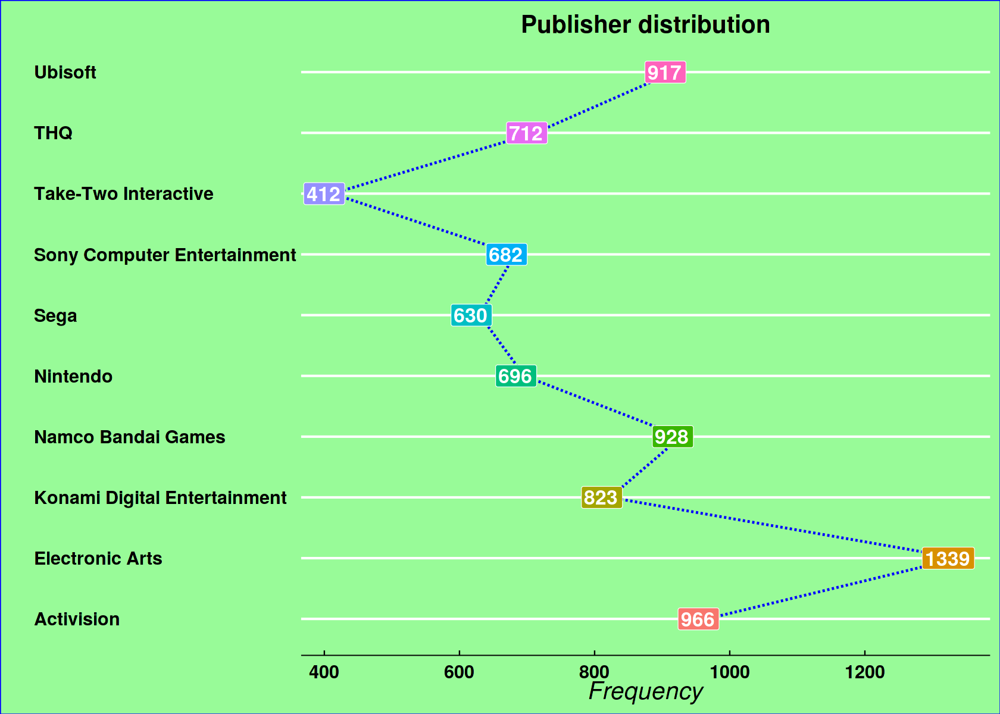

In [81]:
options(repr.plot.width = 14, repr.plot.height = 10)
ggplot(data = freq_published, mapping = aes(x = Frequency, y = row.names(freq_published))) +
         geom_line(group = 1, size = 1, color = "blue", linetype = "dashed") +
         geom_label(mapping = aes(label=Frequency, fill = row.names(freq_published)), size = 7, color = "white", fontface = "bold", hjust=.7) +
         ggtitle("Publisher distribution") +
         xlab("Frequency") +
         ylab("") +
         theme_economist() +
         theme(plot.background = element_rect(fill = "#98FB98", color = "blue"),
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 18, face = "bold"),
               axis.text.y = element_text(size = 18, face = "bold"),
               legend.position = "none")

---

## B. Central Trend Measures

><i> In statistics, a <b>central trend</b> is a central value or typical value for a probability distribution. The most common measures of central tendency are the <b>arithmetic mean</b>, the <b>median</b> and <b>mode</b>.</i>

<a id="medidas"></a>

### Mean

><i>In statistics, <b>mean</b> is defined as the value that shows the concentration of the data in a distribution, as the equilibrium point of the frequencies in a histogram. <b>Average</b> is also interpreted as a significant value in a list of numbers.</i>

---

> ## $\mu = \frac{1}{n}\sum_{i=0}^{n}X_i$

---

In [82]:
df_means <- data.frame(Mean = c(mean(data$NA_Sales), mean(data$EU_Sales), mean(data$JP_Sales), mean(data$Other_Sales), mean(data$Global_Sales)))
row.names(df_means) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_means

,Mean
,<dbl>
NA_Sales,0.26546346
EU_Sales,0.14759052
JP_Sales,0.07867733
Other_Sales,0.04833609
Global_Sales,0.54034307


<center><img src = "https://uploaddeimagens.com.br/images/002/727/008/full/Pale_Blue_and_Violet_Donut_Memphis_Cool_Presentation.png?1593029343"></center>

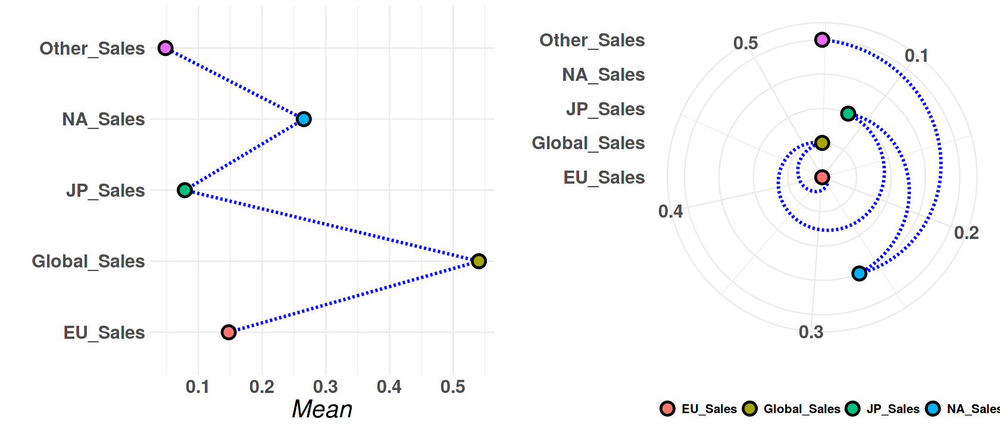

In [83]:
options(repr.plot.width = 14, repr.plot.height = 6)
a <- ggplot(data = df_means, mapping = aes(x = Mean, y = row.names(df_means))) +
         geom_line(group = 1, size = 1.2, linetype = "dashed", color = "blue") +
         geom_point(size = 5, shape = 21, stroke = 1.5, mapping = aes(fill = row.names(df_means))) +
         theme_minimal() +
         ylab("") +
         theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 18, face = "bold"),
               axis.text.y = element_text(size = 18, face = "bold"),
               legend.position = "none")

b <- ggplot(data = df_means, mapping = aes(x = Mean, y = row.names(df_means))) +
         geom_line(group = 1, size = 1.2, linetype = "dashed", color = "blue") +
         geom_point(size = 5, stroke = 1.5, shape = 21, mapping = aes(fill = row.names(df_means))) +
         theme_minimal() +
         ylab("") +
         xlab("") +
         theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 18, face = "bold"),
               axis.text.y = element_text(size = 18, face = "bold"),
               legend.position = "bottom",
               legend.title = element_text(color = "white"),
               legend.text = element_text(size = 12, face = "bold"))

plot_grid(a, b + coord_polar(), nrow = 1, ncol = 2)

### Median

><i> <b>Median</b> is the value that separates the major and minor half of a sample, population or probability distribution. In simpler terms, <b>median</b> can be the middle value of a data set. In the data set {1, 3, 3, 6, 7, 8, 9}, for example, the <b>median</b> is 6.</i>

---

> <center><img src = "https://www.mhnederlof.nl/images/median.jpg"></center>

---

In [84]:
df_median <- data.frame(Median = c(median(data$NA_Sales), median(data$EU_Sales), median(data$JP_Sales), median(data$Other_Sales), median(data$Global_Sales)))
row.names(df_median) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_median

,Median
,<dbl>
NA_Sales,0.08
EU_Sales,0.02
JP_Sales,0.00
Other_Sales,0.01
Global_Sales,0.17


### Mode

><i> <b>Mode</b> is one of the measures of height in a data set, as well as the mean and median. It can be defined in sample and population <b>mode</b>. In relation to the first one, the sampling mode of a data set deals with the value that occurs most frequently or the most common value in a data set.</i>

In [85]:
Mode <- function(x){
    
    freq <- table(x)
    return(names(freq)[freq == max(freq)])
    
}

df_mode <- data.frame(Mode = c(Mode(data$NA_Sales), Mode(data$EU_Sales), Mode(data$JP_Sales), Mode(data$Other_Sales), Mode(data$Global_Sales)))
row.names(df_mode) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_mode

,Mode
,<fct>
NA_Sales,0
EU_Sales,0
JP_Sales,0
Other_Sales,0
Global_Sales,0.02


In [86]:
df_meds <- data.frame(Mean = df_means$Mean, Median = df_median, Mode = df_mode)
df_meds

,Mean,Median,Mode
,<dbl>,<dbl>,<fct>
NA_Sales,0.26546346,0.08,0
EU_Sales,0.14759052,0.02,0
JP_Sales,0.07867733,0.00,0
Other_Sales,0.04833609,0.01,0
Global_Sales,0.54034307,0.17,0.02


### Relationships between central tendency measures

><i> Understanding the relationships that exist between measures of central tendency helps us to identify whether a particular variable is symmetric or asymmetric, as well as whether it has strong candidates for outliers, we will visualize the relationships between these metrics of the variables <b>Price</b> and <b>Minimum nights</b>.</i>

---

<center><img src="https://keydifferences.com/wp-content/uploads/2016/04/mean-vs-median.jpg"></center>

<font color = "red"><b>Note: </b></font>

><i> As they are sales in <b>(millions)</b>, we can create a hypothesis to explain these values of zeros that appear in the median and in fashion. Most of the published games did not reach values close to 1 million, but, on the contrary, well below 1 million. Bearing in mind that this is a hypothesis and nothing more, these values can be for various reasons, such as discrepancies, but investigations must be carried out in order to draw any conclusions. The purpose here is just to explore and describe the information contained in the data.</i>

----

---

## C. Separating Measures

><i><b>Separation measures</b>. These are numbers that divide the ordered sequence of data into parts that contain the same number of elements in the series. Thus, the median that divides the ordered sequence into two groups, each containing <font color = "green"><b>50%</b></font> of the sequence values, is also a separating measure.</i> 


---

> <img src = "https://4.bp.blogspot.com/-A9s_esgz4NE/UDq6XNsrPOI/AAAAAAAAALs/ZmEz8Gj7cts/s1600/Separatrizes.jpg">

---

<a id = "Separating Measures"></a>

### Percentile

><i> In <b>descriptive statistics</b>, <b>percentiles</b> are measures that divide the sample into <b>100 parts</b>, each with an approximately equal percentage of data. The k-th percentile Pₖ is the x value that corresponds to the cumulative frequency of N .k / 100, where N is the sample size. Therefore:</i>

In [87]:
percentile <- c()
for(i in 1:99){
    
    percentile <- c(percentile, i / 100)
    
}

df_percentiles <- data.frame(NA_Sales = quantile(data$NA_Sales, percentile), EU_Sales = quantile(data$EU_Sales, percentile), JP_Sales = quantile(data$JP_Sales, percentile),
                             Other_Sales = quantile(data$Other_Sales, percentile), Global_Sales = quantile(data$Global_Sales, percentile))
df_percentiles

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1%,0.00,0,0,0,0.01
2%,0.00,0,0,0,0.01
3%,0.00,0,0,0,0.01
4%,0.00,0,0,0,0.02
5%,0.00,0,0,0,0.02
6%,0.00,0,0,0,0.02
7%,0.00,0,0,0,0.02
8%,0.00,0,0,0,0.02
9%,0.00,0,0,0,0.02


><i> I will leave a table with information that I think is important for this analysis, I will divide the 5 variables into 5 parts, which are: <font color = "green"><b>25%</b></font>, <font color = "green"><b>50%</b></font>, <font color = "green"><b>75%</b></font> and <font color = "green"><b>99%</b></font></i>.

---

|Percent (%)|NA_Sales|EU_Sales|JP_Sales|Other_Sales|Global_Sales|
|---|---|---|---|---|---|
|25%|0|0|0|0|0.06|
|50%|0.08|0.02|0|0.01|0.17|
|75%|0.240|0.11|0.040|0.04|0.48|
|99%|2.8156|1.94|1.27|0.65|5.46|

---

><i> This table is interpreted as follows: <font color = "green"><b>75.00%</b></font> of game sales in Europe are below 0.24 million.</i>

---

---

## D. Dispersion Measures

><i> In <b>Statistics</b>, scatter shows how stretched or squeezed a distribution is. Common examples of <b>statistical dispersion</b> measures are variance, standard deviation and interquartile range. Dispersion is contrasted with central position or trend, and together they are the most widely used distribution properties.</i>

<a id="dispersao"></a>


### absolute mean deviation

><i> In <b>statistics</b>, the <b>absolute deviation</b> of an element in a data set is the absolute difference between that element and a given point. Typically the point from which the deviation is measured is measured from a central trend, most often the median or sometimes the average of the data set.</i>


---


> #### <center>Illustration of the calculation of the mean absolute deviation</center>

> <center><img src = "https://ds055uzetaobb.cloudfront.net/brioche/uploads/EHwa5QFPhK-mean-absolute-deviation.svg?width=300"></center>

---

> ## <center>$DM = \frac{1}{n}\sum_{i=0}^{n}|X_i - \bar{X}|$</center>

---

In [88]:
df_dm <- data.frame(DM = c(MeanAD(data$NA_Sales), MeanAD(data$EU_Sales), MeanAD(data$JP_Sales), MeanAD(data$Other_Sales), MeanAD(data$Global_Sales)))
row.names(df_dm) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_dm

,DM
,<dbl>
NA_Sales,0.30947311
EU_Sales,0.19126483
JP_Sales,0.11670815
Other_Sales,0.06172115
Global_Sales,0.59452820


#### Variance

><i> In probability theory and <b>statistics</b>, the <b>variance</b> of a random variable or stochastic process is a measure of its statistical dispersion, indicating "how far" in general its values are from the expected value.</i>

---

**Population Variance**

> ## $\sigma^2 = \frac{1}{n-1}\sum_{i=0}^{n}(X_i-\bar{X})^2$

**Sample Variance**

> ## $s^2 = \frac{1}{n}\sum_{i=0}^{n}(X_i-\bar{X})^2$

---

In [89]:
df_var <- data.frame(Variance = c(var(data$NA_Sales), var(data$EU_Sales), var(data$JP_Sales), var(data$Other_Sales), var(data$Global_Sales)))
row.names(df_var) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_var

,Variance
,<dbl>
NA_Sales,0.67516400
EU_Sales,0.25890063
JP_Sales,0.09709044
Other_Sales,0.03606483
Global_Sales,2.45206289


#### Standard deviation

><i> In probability, the <b>standard deviation</b> or population standard deviation is a measure of dispersion around the population mean of a random variable.</i>

---

**Population Variance**

> ## $\sigma = \sqrt{\frac{1}{n-1}\sum_{i=0}^{n}(X_i-\bar{X})^2}$

**Sample Variance**

> ## $s = \sqrt{\frac{1}{n}\sum_{i=0}^{n}(X_i-\bar{X})^2}$

---

In [90]:
df_std <- data.frame(std = c(sqrt(var(data$NA_Sales)), sqrt(var(data$EU_Sales)), sqrt(var(data$JP_Sales)), sqrt(var(data$Other_Sales)), sqrt(var(data$Global_Sales))))
row.names(df_std) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_std

,std
,<dbl>
NA_Sales,0.8216836
EU_Sales,0.5088228
JP_Sales,0.3115934
Other_Sales,0.1899074
Global_Sales,1.5659064


In [91]:
df_dispersion <- data.frame(DM = df_dm$DM, Variance = df_var$Variance, std = df_std$std)
row.names(df_dispersion) <- c("NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales")
df_dispersion

,DM,Variance,std
,<dbl>,<dbl>,<dbl>
NA_Sales,0.30947311,0.67516400,0.8216836
EU_Sales,0.19126483,0.25890063,0.5088228
JP_Sales,0.11670815,0.09709044,0.3115934
Other_Sales,0.06172115,0.03606483,0.1899074
Global_Sales,0.59452820,2.45206289,1.5659064


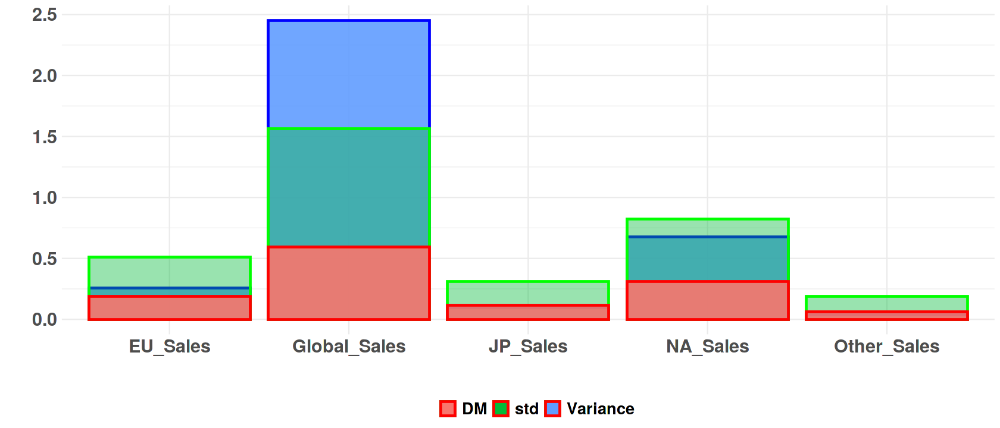

In [92]:
ggplot(data = df_dispersion) +
    geom_bar(stat = "identity", mapping = aes(x = row.names(df_dispersion), y = Variance, fill = "Variance"), alpha = .9, size = 1, color = "blue") +
    geom_bar(stat = "identity", mapping = aes(x = row.names(df_dispersion), y = std, fill = "std"), alpha = .4, size = 1, color = "green") +
    geom_bar(stat = "identity", mapping = aes(x = row.names(df_dispersion), y = DM, fill = "DM"), alpha = .9, size = 1, color = "red") +
    xlab("") +
    ylab("") +
    theme_minimal() +
    theme(plot.title = element_text(size = 24, hjust = .5, face = "bold"),
          axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
          axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
          axis.text.x = element_text(size = 18, face = "bold"),
          axis.text.y = element_text(size = 18, face = "bold"),
          legend.position = "bottom",
          legend.title = element_text(color = "white"),
          legend.text = element_text(size = 16, face = "bold"))

---

# 3. Exploratory Analysis

><i> In <b>statistics</b>, exploratory data analysis (<b>EAD</b>) is an approach to the analysis of data sets in order to summarize their main characteristics, often with visual methods.</i>

---

<center><img src = "https://phhp-faculty-cantrell.sites.medinfo.ufl.edu/files/2012/07/images-mod1-big-picture-eda.gif"></center>

---

<font color = "red"><b>Note: </b></font>

><i> In this notebook, this will be the last step, the exploratory analysis. As you can see in the image above, the next steps would be the work of probability and inference; if you want to know about these subjects, you can check out my kaggle notebooks, you will probably find something there.</i>

---

## A. Analysis of the world's best-selling games

<a id="mais"></a>

### The best selling games in North America, Europe, Japan and the rest of the world


In [93]:
# NA_Sales
t_v_name_NA <- aggregate(list(NA_Sales = data$NA_Sales), list(Name = data$Name), sum)
t_v_name_NA <- t_v_name_NA[order(t_v_name_NA$NA_Sales, decreasing = T), ]

# EU_Sales
t_v_name_EU <- aggregate(list(EU_Sales = data$EU_Sales), list(Name = data$Name), sum)
t_v_name_EU <- t_v_name_EU[order(t_v_name_EU$EU_Sales, decreasing = T), ]


# JP_Sales
t_v_name_JP <- aggregate(list(JP_Sales = data$JP_Sales), list(Name = data$Name), sum)
t_v_name_JP <- t_v_name_JP[order(t_v_name_JP$JP_Sales, decreasing = T), ]

# Other_Sales
t_v_name_Other <- aggregate(list(Other_Sales = data$Other_Sales), list(Name = data$Name), sum)
t_v_name_Other <- t_v_name_Other[order(t_v_name_Other$Other_Sales, decreasing = T), ]

# Global_Sales
t_v_name_Global <- aggregate(list(Global_Sales = data$Global_Sales), list(Name = data$Name), sum)
t_v_name_Global <- t_v_name_Global[order(t_v_name_Global$Global_Sales, decreasing = T), ]

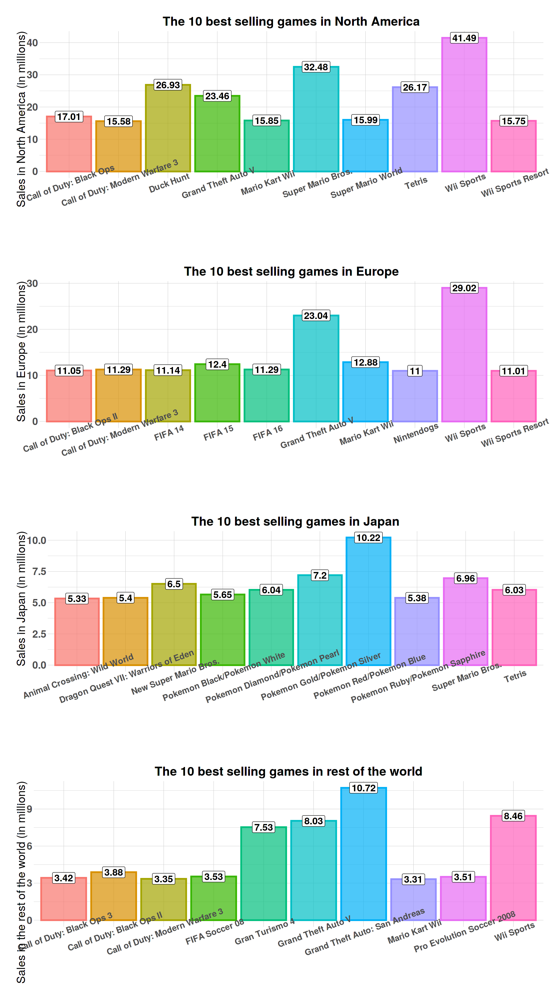

In [94]:
options(repr.plot.width = 14, repr.plot.height = 25)
a <- ggplot(data = head(t_v_name_NA, 10), mapping = aes(x = Name, y = NA_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Name, color = Name), size = 1.1, alpha = .7) +
         geom_label(mapping = aes(label = NA_Sales), size = 6, fontface = "bold") +
         xlab("") +
         ylab("Sales in North America (in millions)") +
         ggtitle("The 10 best selling games in North America") +
         theme_ipsum() +
         theme(legend.position = "none",
               plot.title = element_text(size = 22, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold", angle = 20),
               axis.text.y = element_text(size = 18, face = "bold"),
               axis.title.y = element_text(size = 20))

b <- ggplot(data = head(t_v_name_EU, 10), mapping = aes(x = Name, y = EU_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Name, color = Name), size = 1.1, alpha = .7) +
         geom_label(mapping = aes(label = EU_Sales), size = 6, fontface = "bold") +
         xlab("") +
         ylab("Sales in Europe (in millions)") +
         ggtitle("The 10 best selling games in Europe") +
         theme_ipsum() +
         theme(legend.position = "none",
               plot.title = element_text(size = 22, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold", angle = 20),
               axis.text.y = element_text(size = 18, face = "bold"),
               axis.title.y = element_text(size = 20))

c <- ggplot(data = head(t_v_name_JP, 10), mapping = aes(x = Name, y = JP_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Name, color = Name), size = 1.1, alpha = .7) +
         geom_label(mapping = aes(label = JP_Sales), size = 6, fontface = "bold") +
         xlab("") +
         ylab("Sales in Japan (in millions)") +
         ggtitle("The 10 best selling games in Japan") +
         theme_ipsum() +
         theme(legend.position = "none",
               plot.title = element_text(size = 22, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold", angle = 20),
               axis.text.y = element_text(size = 18, face = "bold"),
               axis.title.y = element_text(size = 20))

d <- ggplot(data = head(t_v_name_Other, 10), mapping = aes(x = Name, y = Other_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Name, color = Name), size = 1.1, alpha = .7) +
         geom_label(mapping = aes(label = Other_Sales), size = 6, fontface = "bold") +
         xlab("") +
         ylab("Sales in the rest of the world (in millions)") +
         ggtitle("The 10 best selling games in rest of the world") +
         theme_ipsum() +
         theme(legend.position = "none",
               plot.title = element_text(size = 22, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold", angle = 20),
               axis.text.y = element_text(size = 18, face = "bold"),
               axis.title.y = element_text(size = 20))


plot_grid(a, b, c, d, nrow = 4, ncol = 1)

### The best selling games in the world from 1980 to <font color = "red">2016</font>

In [95]:
a <- c()

for(i in 1:nrow(t_v_name_Global)){
    a <- c(a, i)
}

row.names(t_v_name_Global) <- a
head(t_v_name_Global, 10)

,Name,Global_Sales
,<chr>,<dbl>
1,Wii Sports,82.74
2,Grand Theft Auto V,55.92
3,Super Mario Bros.,45.31
4,Tetris,35.84
5,Mario Kart Wii,35.82
6,Wii Sports Resort,33.00
7,Pokemon Red/Pokemon Blue,31.37
8,Call of Duty: Modern Warfare 3,30.83
9,New Super Mario Bros.,30.01


---

<center><img src = "https://i.ibb.co/WtxX3ZZ/Wii-Sports.gif"></center>

---

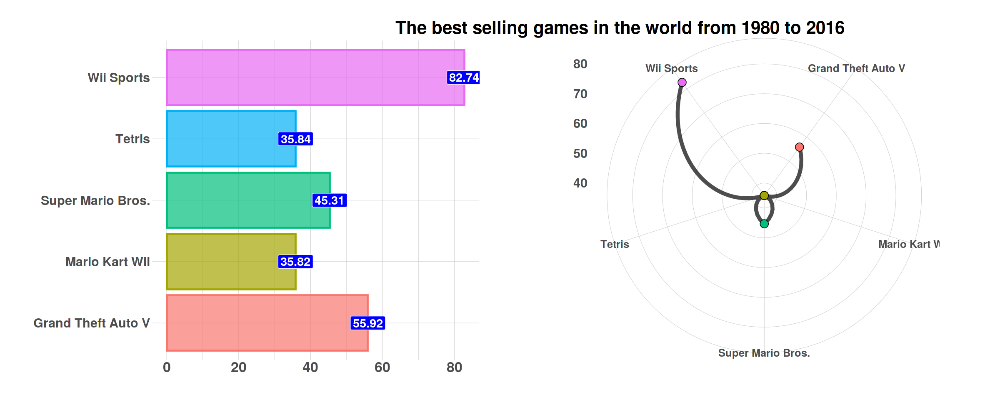

In [96]:
options(repr.plot.width = 20, repr.plot.height = 8)
a <- ggplot(data = head(t_v_name_Global, 5), mapping = aes(x = Name, y = Global_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Name, color = Name), size = 1, alpha = .7) +
         geom_label(mapping = aes(label = Global_Sales), color = "white", fill = "blue", size = 6, fontface = "bold") +
         xlab("") +
         ylab("") +
         ggtitle("The best selling games in the world from 1980 to 2016") +
         theme_ipsum() +
         coord_flip() +
         theme(legend.position = "none",
               plot.title = element_text(size = 25, face = "bold", hjust = -2, vjust = 4),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 18, face = "bold"),
               axis.title.y = element_text(size = 20))

b <- ggplot(data = head(t_v_name_Global, 5), mapping = aes(x = Name, y = Global_Sales)) +
         geom_line(size = 2, alpha = .7, group = 1) +
         geom_point(mapping = aes(fill = Name), shape = 21, size = 5) +
         theme_ipsum() +
         xlab("") +
         ylab("") +
         theme(legend.position = "none",
               axis.text.x = element_text(size = 15, face = "bold"),
               axis.text.y = element_text(size = 18, face = "bold"),
               axis.title.y = element_text(size = 20))

plot_grid(a, b + coord_polar(), nrow = 1, ncol = 2)

In [97]:
df_top_5 <- data[data$Name == "Wii Sports" | data$Name == "Grand Theft Auto V" | data$Name == "Super Mario Bros." | data$Name == "Tetris" | data$Name == "Mario Kart Wii", ]

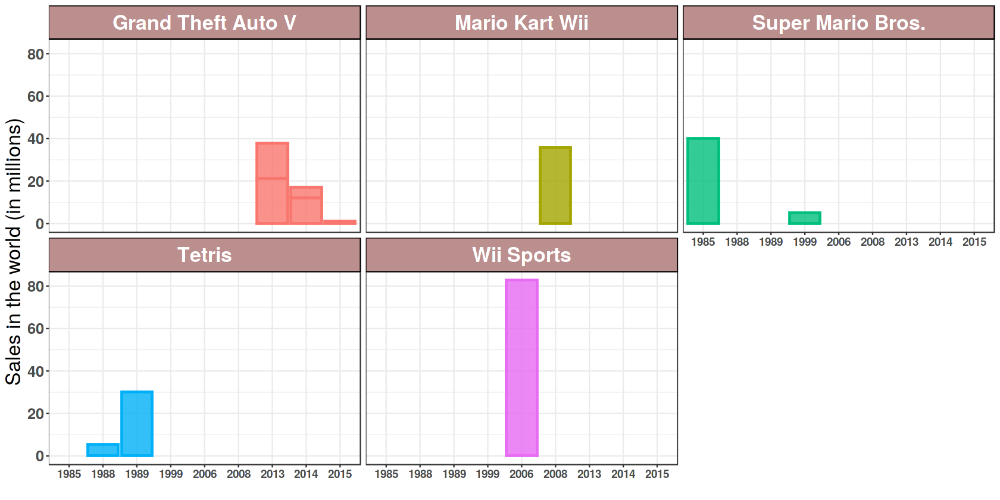

In [98]:
options(repr.plot.width = 14, repr.plot.height = 7)
ggplot(data = df_top_5, mapping = aes(x = Year, y = Global_Sales)) +
    geom_bar(stat = "identity", mapping = aes(fill = Name, color = Name), size = 1, alpha = .8) +
    facet_wrap(~Name) +
    theme_bw() +
    xlab("") +
    ylab("Sales in the world (in millions)") +
    theme(
          legend.position = "none",
          strip.text.x = element_text(margin = margin(7, 7, 7, 7), size = 20, face = "bold", color = "white"),
          strip.background = element_rect(fill = "#BC8F8F", color = "black"),
          plot.title = element_text(size = 22, face = "bold", hjust = .5),
          axis.text.x = element_text(size = 11, face = "bold"),
          axis.text.y = element_text(size = 15, face = "bold"),
          axis.title.y = element_text(size = 20))

## B. Number of Sales per platform

<a id="plataforma"></a>

In [99]:
# NA_Sales
p_name_NA <- aggregate(list(NA_Sales = data$NA_Sales), list(Platform = data$Platform), sum)
p_name_NA <- p_name_NA[order(p_name_NA$NA_Sales, decreasing = T), ]

# EU_Sales
p_name_EU <- aggregate(list(EU_Sales = data$EU_Sales), list(Platform = data$Platform), sum)
p_name_EU <- p_name_EU[order(p_name_EU$EU_Sales, decreasing = T), ]


# JP_Sales
p_name_JP <- aggregate(list(JP_Sales = data$JP_Sales), list(Platform = data$Platform), sum)
p_name_JP <- p_name_JP[order(p_name_JP$JP_Sales, decreasing = T), ]

# Other_Sales
p_name_Other <- aggregate(list(Other_Sales = data$Other_Sales), list(Platform = data$Platform), sum)
p_name_Other <- p_name_Other[order(p_name_Other$Other_Sales, decreasing = T), ]

# Global_Sales
p_name_Global <- aggregate(list(Global_Sales = data$Global_Sales), list(Platform = data$Platform), sum)
p_name_Global <- p_name_Global[order(p_name_Global$Global_Sales, decreasing = T), ]

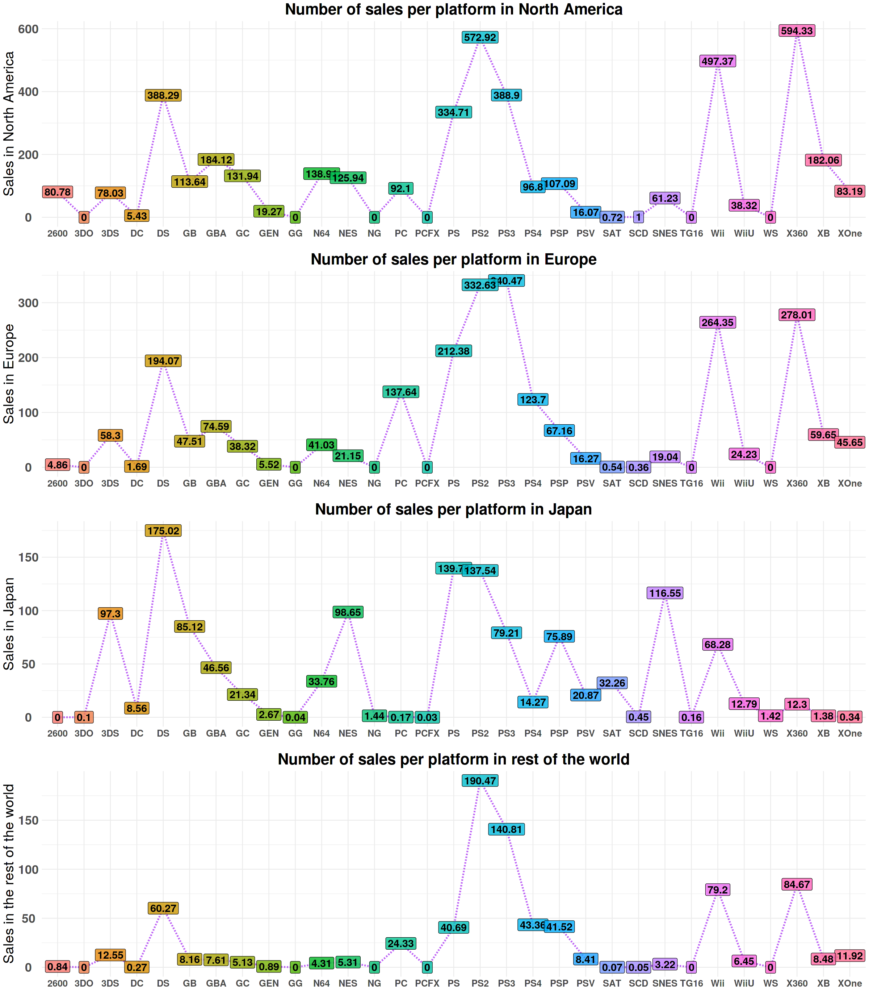

In [100]:
options(repr.plot.width = 20, repr.plot.height = 23)
a <- ggplot(data = p_name_NA, 10, mapping = aes(x = Platform, y = NA_Sales)) +
         geom_line(size = 1.1, alpha = .7, group = 1, linetype = 2, color = "purple") +
         geom_label(mapping = aes(label = NA_Sales, fill = Platform), color = "black", size = 6, fontface = "bold", alpha = .8) +
         xlab("") +
         ylab("Sales in North America") +
         ggtitle("Number of sales per platform in North America") +
         theme_minimal() +
         theme(
               legend.position = "none",
               plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold", hjust = .5),
               axis.title.y = element_text(size = 23, hjust = .5))

b <- ggplot(data = p_name_EU, 10, mapping = aes(x = Platform, y = EU_Sales)) +
         geom_line(size = 1.1, alpha = .7, group = 1, linetype = 2, color = "purple") +
         geom_label(mapping = aes(label = EU_Sales, fill = Platform), color = "black", size = 6, fontface = "bold", alpha = .8) +
         xlab("") +
         ylab("Sales in Europe") +
         ggtitle("Number of sales per platform in Europe") +
         theme_minimal() +
         theme(
               legend.position = "none",
               plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold", hjust = .5),
               axis.title.y = element_text(size = 23, hjust = .5))

c <- ggplot(data = p_name_JP, 10, mapping = aes(x = Platform, y = JP_Sales)) +
         geom_line(size = 1.1, alpha = .7, group = 1, linetype = 2, color = "purple") +
         geom_label(mapping = aes(label = JP_Sales, fill = Platform), color = "black", size = 6, fontface = "bold", alpha = .8) +
         xlab("") +
         ylab("Sales in Japan") +
         ggtitle("Number of sales per platform in Japan") +
         theme_minimal() +
         theme(
               legend.position = "none",
               plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold", hjust = .5),
               axis.title.y = element_text(size = 23, hjust = .5))

d <- ggplot(data = p_name_Other, 10, mapping = aes(x = Platform, y = Other_Sales)) +
         geom_line(size = 1.1, alpha = .7, group = 1, linetype = 2, color = "purple") +
         geom_label(mapping = aes(label = Other_Sales, fill = Platform), color = "black", size = 6, fontface = "bold", alpha = .8) +
         xlab("") +
         ylab("Sales in the rest of the world") +
         ggtitle("Number of sales per platform in rest of the world") +
         theme_minimal() +
         theme(
               legend.position = "none",
               plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold", hjust = .5),
               axis.title.y = element_text(size = 23, hjust = .5))

plot_grid(a, b, c, d, nrow = 4, ncol = 1)

### The 10 platforms with the highest number of game sales in the world

In [101]:
a <- c()

for(i in 1:nrow(p_name_Global)){
    a <- c(a, i)
}

row.names(p_name_Global) <- a
head(p_name_Global, 10)

,Platform,Global_Sales
,<chr>,<dbl>
1,PS2,1233.46
2,X360,969.61
3,PS3,949.35
4,Wii,909.81
5,DS,818.67
6,PS,727.39
7,GBA,313.56
8,PSP,291.71
9,PS4,278.07


<center><img src = "https://i.ibb.co/BL39qgP/Design-sem-nome.gif"></center>

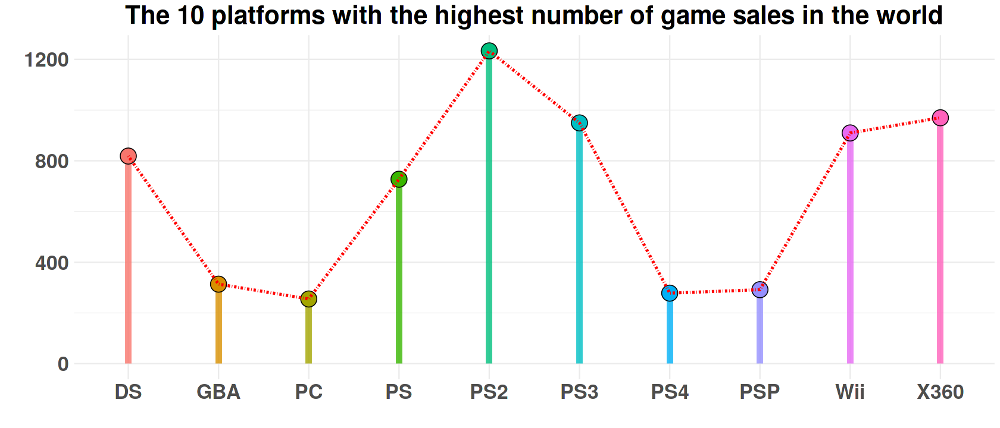

In [102]:
options(repr.plot.width = 14, repr.plot.height = 6)
ggplot(data = head(p_name_Global, 10), mapping = aes(x = Platform, y = Global_Sales)) +
         geom_segment(aes(xend=Platform, yend=0, color = Platform), size = 2.3, alpha = .8) +
         geom_point(mapping = aes(fill = Platform), size = 7, shape = 21) +
         geom_line(group = 1, size = 1.1, linetype = 10, color = "red") +
         xlab("") +
         ylab("") +
         ggtitle("The 10 platforms with the highest number of game sales in the world") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

In [103]:
d_top_10 <- data[data$Platform == "PS2" | data$Platform == "X360" | data$Platform == "PS3" | data$Platform == "Wii" | data$Platform == "DS" | data$Platform == "PS" | data$Platform == "GBA"
                | data$Platform == "PSP" | data$Platform == "PS4" | data$Platform == "PC", ]
d_top_10$Year <- as.numeric(levels(d_top_10$Year))[d_top_10$Year]

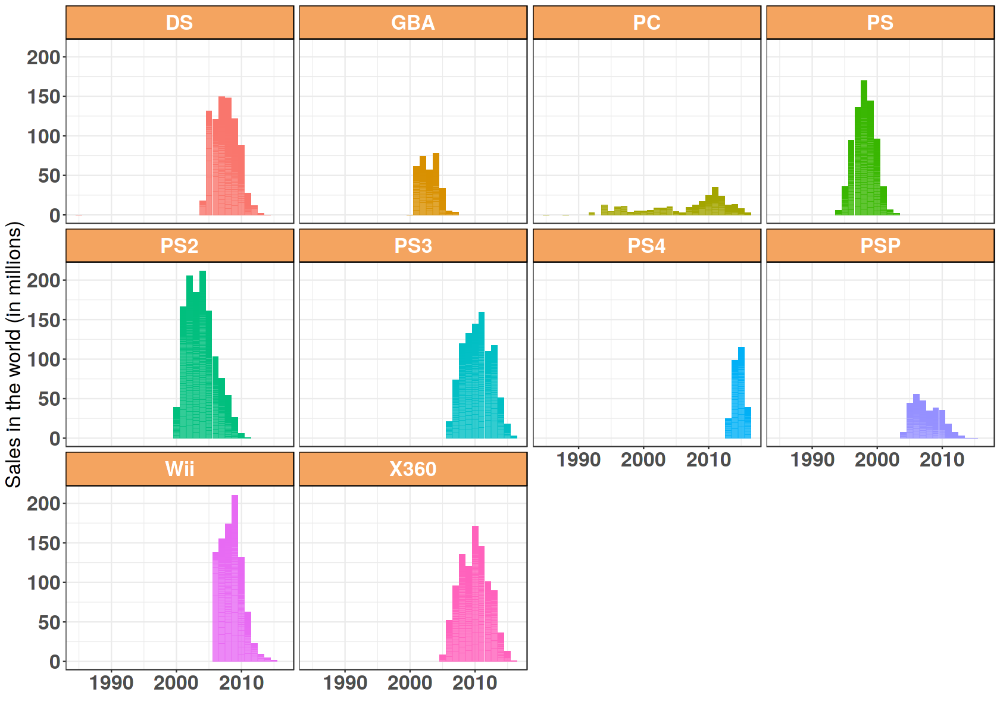

In [104]:
options(repr.plot.width = 14, repr.plot.height = 10)
ggplot(data = d_top_10, mapping = aes(x = Year, y = Global_Sales)) +
    geom_bar(stat = "identity", mapping = aes(fill = Platform, color = Platform), size = .1, alpha = .8) +
    facet_wrap(~Platform) +
    theme_bw() +
    xlab("") +
    ylab("Sales in the world (in millions)") +
    theme(
          legend.position = "none",
          strip.text.x = element_text(margin = margin(7, 7, 7, 7), size = 20, face = "bold", color = "white"),
          strip.background = element_rect(fill = "#F4A460", color = "black"),
          plot.title = element_text(size = 22, face = "bold", hjust = .5),
          axis.text.x = element_text(size = 20, face = "bold"),
          axis.text.y = element_text(size = 20, face = "bold"),
          axis.title.y = element_text(size = 20))

## C. Game Sales by Genre

<a id="genero"></a>

### Best-selling people from 1980 to 2016 by features

In [105]:
# NA_Sales
g_name_NA <- aggregate(list(NA_Sales = data$NA_Sales), list(Genre = data$Genre), sum)
g_name_NA <- g_name_NA[order(g_name_NA$NA_Sales, decreasing = T), ]

# EU_Sales
g_name_EU <- aggregate(list(EU_Sales = data$EU_Sales), list(Genre = data$Genre), sum)
g_name_EU <- g_name_EU[order(g_name_EU$EU_Sales, decreasing = T), ]


# JP_Sales
g_name_JP <- aggregate(list(JP_Sales = data$JP_Sales), list(Genre = data$Genre), sum)
g_name_JP <- g_name_JP[order(g_name_JP$JP_Sales, decreasing = T), ]

# Other_Sales
g_name_Other <- aggregate(list(Other_Sales = data$Other_Sales), list(Genre = data$Genre), sum)
g_name_Other <- g_name_Other[order(g_name_Other$Other_Sales, decreasing = T), ]

# Global_Sales
g_name_Global <- aggregate(list(Global_Sales = data$Global_Sales), list(Genre = data$Genre), sum)
g_name_Global <- g_name_Global[order(g_name_Global$Global_Sales, decreasing = T), ]

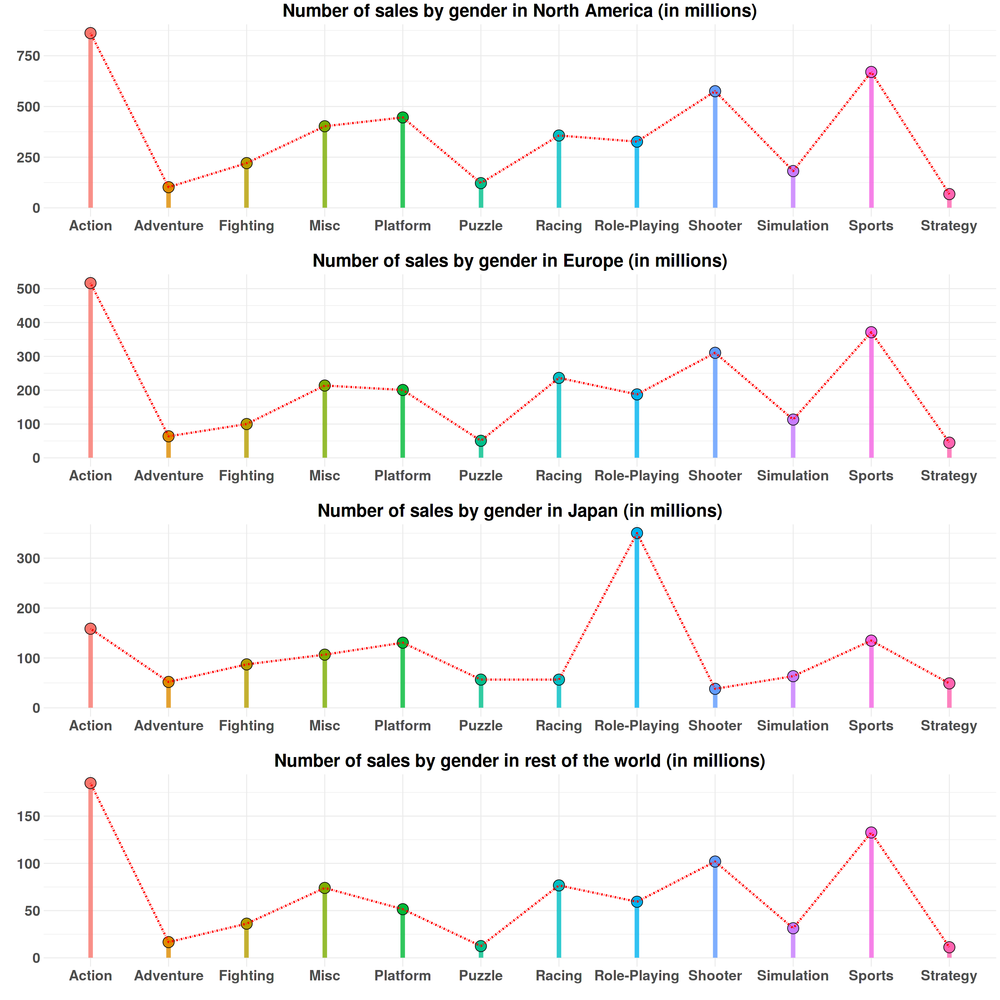

In [106]:
options(repr.plot.width = 20, repr.plot.height = 20)
a <- ggplot(data = g_name_NA, mapping = aes(x = Genre, y = NA_Sales)) +
         geom_segment(aes(xend=Genre, yend=0, color = Genre), size = 2.3, alpha = .8) +
         geom_point(mapping = aes(fill = Genre), size = 7, shape = 21) +
         geom_line(group = 1, size = 1.1, linetype = 10, color = "red") +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by gender in North America (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

b <- ggplot(data = g_name_EU, mapping = aes(x = Genre, y = EU_Sales)) +
         geom_segment(aes(xend=Genre, yend=0, color = Genre), size = 2.3, alpha = .8) +
         geom_point(mapping = aes(fill = Genre), size = 7, shape = 21) +
         geom_line(group = 1, size = 1.1, linetype = 10, color = "red") +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by gender in Europe (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

c <- ggplot(data = g_name_JP, mapping = aes(x = Genre, y = JP_Sales)) +
         geom_segment(aes(xend=Genre, yend=0, color = Genre), size = 2.3, alpha = .8) +
         geom_point(mapping = aes(fill = Genre), size = 7, shape = 21) +
         geom_line(group = 1, size = 1.1, linetype = 10, color = "red") +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by gender in Japan (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

d <- ggplot(data = g_name_Other, mapping = aes(x = Genre, y = Other_Sales)) +
         geom_segment(aes(xend=Genre, yend=0, color = Genre), size = 2.3, alpha = .8) +
         geom_point(mapping = aes(fill = Genre), size = 7, shape = 21) +
         geom_line(group = 1, size = 1.1, linetype = 10, color = "red") +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by gender in rest of the world (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold"),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, c, d, nrow = 4, ncol = 1)

<center><img src = "https://i.ibb.co/GR3mSjR/Theo-Kate.gif"></center>

### Best selling genres in the world

In [107]:
a <- c()

for(i in 1:nrow(g_name_Global)){
    a <- c(a, i)
}

row.names(g_name_Global) <- a
g_name_Global

,Genre,Global_Sales
,<chr>,<dbl>
1,Action,1722.87
2,Sports,1309.24
3,Shooter,1026.20
4,Role-Playing,923.80
5,Platform,829.15
6,Misc,797.62
7,Racing,726.77
8,Fighting,444.05
9,Simulation,389.87


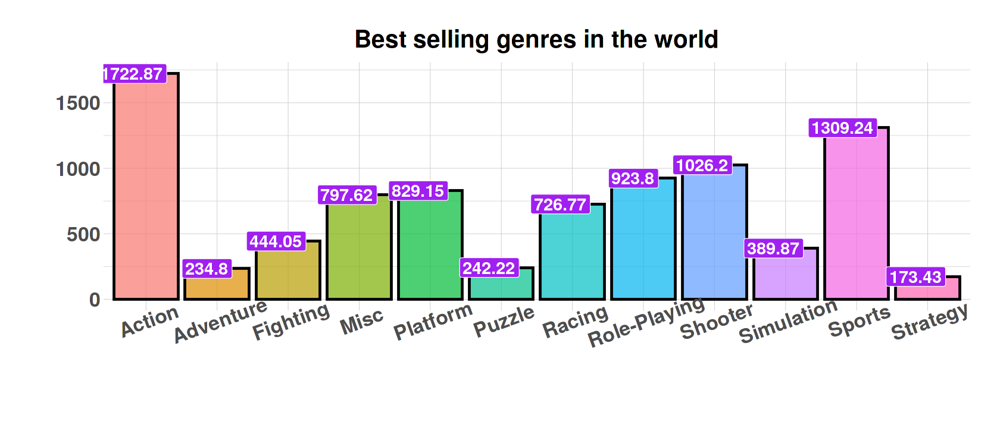

In [108]:
options(repr.plot.width = 14, repr.plot.height = 6)
ggplot(data = g_name_Global, mapping = aes(x = Genre, y = Global_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Genre), alpha = .7, size = 1, color = "black") +
         geom_label(mapping = aes(label=Global_Sales), fill = "purple", size = 6, color = "white", fontface = "bold", hjust=.7) +
         ggtitle("Best selling genres in the world") +
         xlab(" ") +
         ylab("") +
         theme_ipsum() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 20),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

In [109]:
g_top_10 <- data[data$Genre == "Action" | data$Genre == "Sports" | data$Genre == "Shooter" | data$Genre == "Role-Playing" | data$Genre == "Racing", ]
g_top_10$Year <- as.numeric(levels(g_top_10$Year))[g_top_10$Year]

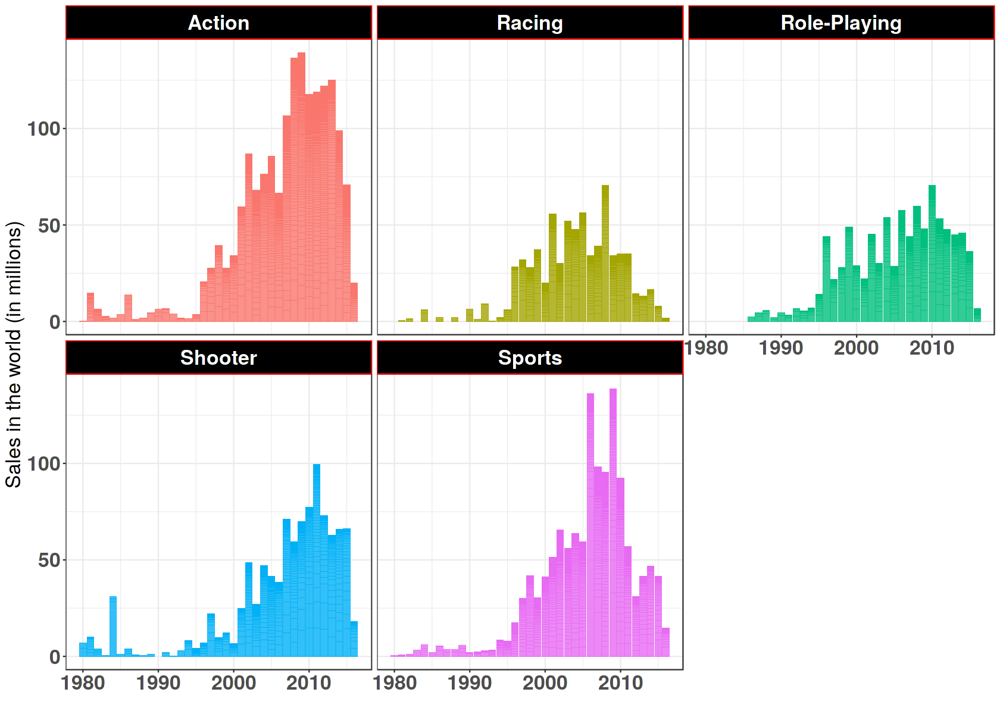

In [110]:
options(repr.plot.width = 14, repr.plot.height = 10)
ggplot(data = g_top_10, mapping = aes(x = Year, y = Global_Sales)) +
    geom_bar(stat = "identity", mapping = aes(fill = Genre, color = Genre), size = .1, alpha = .8) +
    facet_wrap(~Genre) +
    theme_bw() +
    xlab("") +
    ylab("Sales in the world (in millions)") +
    theme(
          legend.position = "none",
          strip.text.x = element_text(margin = margin(7, 7, 7, 7), size = 20, face = "bold", color = "white"),
          strip.background = element_rect(fill = "black", color = "red"),
          plot.title = element_text(size = 22, face = "bold", hjust = .5),
          axis.text.x = element_text(size = 20, face = "bold"),
          axis.text.y = element_text(size = 20, face = "bold"),
          axis.title.y = element_text(size = 20))

In [111]:
ggplot(data = g_top_10, aes(x=Year, y=Global_Sales, group=Genre, color=Genre)) +
    geom_line() +
    geom_point() +
    ggtitle("Sale of games by genre from 1980 to 2016 (in millions)") +
    theme_ipsum() +
    ylab("Sale of games") +
    xlab("") +
    transition_reveal(Year) 

<img src="data:image/gif;base64,R0lGODlh4AHgAfYAAAEBAQwMDBMTExsbGyMjIywsLDQ0NDw8PEREREtLS1RUVFtbW2JiYmtr
a3Nzc3t7e/h2bfh/dgC/faOlALGyJrW3M7u8Qr2+SM/Qeudt5ulv4Odu6eht6edr8+l29Ol6
9FLTp1zWrGDYrnfdugCw9hW39xi39xu59yK69ye8+DK/+DTA+DrC+ELE+ErH+U/J+VXL+WLO
+oODg4uLi5OTk5ubm6Ojo6ysrLOzs7u7u/SBhfmLg/qel/qlnvCDp++Rp/unovuoooHfv9jZ
lNrbmN3eoubnu+2S7+eM8O6X9++c9/Cm8vO3+oXgwYba+4vb+57h/KHi/Lvq/cPDw8vLy9TU
1Nvb2/3Sz/3V0v3f3cHv3+npwfTB+vjW/Pre/M7z5sHs/c7w/dPy/ebm5uzs7P7k4v7t7PX1
4fvn/fvp/eP2/uf4/un4/vT09P/29fv78v31/vP7/////wAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwAAAAA4AHg
AQAH/oBygoOEhYaHiImKi4yNjo+QkZKTlJWWl5iZmpucnZ6foKGio6SlpqeoqaqrrK2ur7Cx
srO0tba3uLm6u7y9vr/AwcLDxMXGx8jJysvMzc7P0NHS09TV1tfY2drb3N3e3+Dh4uPk5ebn
6Onq6+zt7u/w8fLz9PX29/j5+vv8/f7/AAMKHEiwoMGDCBMqXMiwocOHECNKnEixosWLGDNq
3Mixo8ePIEOKHEmypMmTKFNys2FAwAAFYxYBAEDG0hgEARbYGgNAwK+bOUdNAdBgUJsGAwg4
eCPo6AABMAc9KBBAQc1CBgDkeERmgcsGbaQSgHpV0NCig2hQPVDlUBUA/jPkBAAQU9PMmDNr
5pVzV5ODAHXTyZhJWEDgQ3srOZipYCeAAL8WA9AZqg0CooMSEMYsZ8FmA4IebEZgKOuURwdG
h1bd9DJaOTM2DwhbSAFdubc1zcVLk2/v3Zrevj7XZi4DHDYGcEbUt5LmGbRp8fTpS7OM6J5a
zkRL5XGOKXPJtJl5Y4wAAFPgnMdBZW5bQqYddQ+Q48bcKW/WtwfQ9sB5zvlpZQUBAOBQyFsJ
CDJGWZmQcdVeeznISQG9odMdAYPYAABoclihgAABHECFIHs5NcACDGZoQAAG2CAIgTMlWIgD
AxSAA4VWdPhhiCOS0dMUBgwA3YcI5CjHUQSc/njVGDsi8N4gPAVARUsMMHWZA4JoWIAhNNqI
45ENjIXikT1VgVNUPgpQxQAygDmAkoXACIBVPVFBQJtysMSii3KkCaSQbSgQQJGGbIYWDQCQ
JodtNryF4aIA3JADAFtCSgMhcmIpxw0rtmhIDQDIqBkNk3Jo26WGClKqIg0AwOdd46mJUwKH
9QnAAEAKMMMbHx5gJIS9AXsVp3s2VeasdTEpgABOCjJYXBbOtFVTV2VVmF69XUYYh4Qgullc
Ccw1gKaDSPaYe3JYO5MADj421kwrwiuItjNVqi4ABDAF5UzKzaRTbBy2Sq4g5gZwXlv0UvrG
eAG8O6etAmTVZsKV/mY2l1JpZvWAHN4SFpePDf+34lzcFjIYWqKhNdgD46E3hnJVaNiYHK0y
QEi4+MbV8UzQDpJDAzcIYtsMoM5c8yAnC4KoAjgRWsh5tOXFsMMz79vwXAAcEADJJAbrNbY1
7QwXmSH7K8i9+crxVsXmtPHfAAzcoK8Vj1FhxXlbhTdUAFNQoVzQRp33QBWiBRDWZYAbNdcC
OFhrBd1S3q2Vj5Gm21Mb3dG1d99/0z3by1oRwlOiP9/1luGWT9vU4o3PVMXmfhfYMpY3PGYr
vjW8/hjnBRaCuByjE5C72wAMLpoAbYwedFbsZl6rs5zFpqhnRYFKGJaD2SzHYFWfjV6f/uc5
QHhPKUI5Vw6xac890pyJJht2dD/qm3gz0W47IZQvT37mYM/vf15kCN/4AkA/ANgPMm/5nHKm
NRfslMNOmxHAVsZwg9MMqHLhEQ1lUkYIHOBrEAQy0O8IsTc4yCFzVqDgVi54A8qFZTEzO5gG
V9OAzM1gDGOoAnZGZyQCuUg5p3kMdvYWlsxVYTAbJErLYjK6NlBuRNubDA19V7knCsKD8gsh
5WoCQ0GcB4om44wHpVSF8zTGXIl6Awc5FiqshA6LIOydId6QmgKokTOgklEU0bIY+pTRVYTQ
kKLmt0TgzQQ7W5RDF3EzokP+DwBhyQscBUEhHBRydGSwIQ6r/nAVCp1GHVSYyrrCMoUE/Kdy
eWHAZmLUrYcJwjNxGWGGsjaImeRoCh8iTHlmAj20wEyVq0xAG+RUgMTJAQ7TGYRn2qTKGQxl
kFmiZdesAMzNCJOXXSPD6AZRTcLocV5VnIm+lqZMuFCuly/izyGSRslVLmBvVLAPAGiwPjZS
ZhDxIecrx1YIy+wuijND1D3ZKT1BqHJg+iQkNv03iHPuMZ1tEdYjyZBQWLaslpAcJmGKic/K
nYMMVQhMDu5jhbnkhEJBSyWlFMBSBWwsLa7szNhkGc0DDMI9dHvMAlDqUHYqhwqqLEBLXQq8
BWBNjgrqSTnjIrPY9KymgzhYUIfK/rKFHtKhcphqS186iN9htaJw2eZD5fDTdS5nDOEygMAQ
JSNVLgBUNh1rR7cC1qfKgY4/EgRc0clXUGkqfYSITdWkZlVI4g+b7CRQW4CzF8bSpK4X7VpY
xmBUwkwrNXwyxyS9yJ/BGCAmv8sLEgXxhjFgZ7MolQNN5TAUATCFh56tCeIim9jOSvFI4rEC
DtqSAwoNZ3R1oZCL0uSZJ5lFqYYEgBVGe1fTRlahAGAfZUrrQK8uFLWRAhlfFWvW1+grqwCo
wWAUtZgFTOpRsHTjabBrTJqVyWcflGnP2DmUmS2zlYOlyXMTY6zojrWsEgXWGNi7X5pYIQe8
pZD2stLe/nGMzrw3sE0A7liUAKJScz+yQlaeauHBDYaAqvWo4opXBc0odzE2s3ALEcsZxW5O
w3DR0ABM65mBPdgKsclNVgIwAEMUx4AltmVrp2CF1ECnsMlb6ObGsGEqBk2s4CPxh7XJYrRw
1xDs7I4ArDAFEJHBgwCwG4FoEKDdnsdIHTVQh4/4GAbltAZUiPMYyvxHNLNTDniTnOrylKib
6rewDOppi9UZ4K+tecoFboOM5+yZl1Joz+UYzCprsCmdvovSezExv1KUY4+Bs8EFm4tuH8OA
S4u1tiPS9K0c1K+ZBMC4o9uM9uTgvlkTomC2lIOqB1BAjLbLv4LYdYqsC2w2/n7rdnwtK5aX
cy9NoS0s7mMlFQHQpk7zrBBiM2AUvUmIO1s7roOIn68TfVj/+pTQX5sobFYZlwJrs19Ye08D
1cGSZSFAdQ4QgPAeMC7/ISkACTCuior16TnSiAA3OLMi9V0DfjtA0FYeQI7+nQAjlRhEBoA0
TwZwgwIIoEqDGAogD3FwHCic4m15Lo+duFAwEWBQAg9x0LCapU5R2laQGWuS0Nzts3qlAHjq
0wKeEpXQJGkBDpQDDpSjKT15qhCtWuVLH3B07Nx5ex5HuiGg1jXTWnU25d7uACKabonmyeb9
vSnYLx6xadGNbR55w0xMOIuWJb0QcjesSFqV2WM4/rUjymvDYOQXizYkVHQzsUEbYkN4kCBI
GRR6HkZUHV5aaKvB4NzMzUeiGckHQzgfQdIAnj6LWd29Tw4owOj7LpK32HUYf/G8SmZP+9rb
/va4z73ud8/73vv+98APvvCHT/ziG//4yE++8pc/kAXd4PSXkH0nyveJNkCfE9T/hPQ3AYfs
d2L7m/D+SBRAhQTY4J6cAL8mrr8J65dC/OkvxcJKof4G0V4BVkjAG765ifpjAv7rx37rZwoA
OICk4H+XIIAgQQXiQwMG4gkIaA

## D. Number of sales per publisher

<a id ="published"></a>

In [112]:
# NA_Sales
pu_name_NA <- aggregate(list(NA_Sales = data$NA_Sales), list(Publisher = data$Publisher), sum)
pu_name_NA <- pu_name_NA[order(pu_name_NA$NA_Sales, decreasing = T), ]

# EU_Sales
pu_name_EU <- aggregate(list(EU_Sales = data$EU_Sales), list(Publisher = data$Publisher), sum)
pu_name_EU <- pu_name_EU[order(pu_name_EU$EU_Sales, decreasing = T), ]


# JP_Sales
pu_name_JP <- aggregate(list(JP_Sales = data$JP_Sales), list(Publisher = data$Publisher), sum)
pu_name_JP <- pu_name_JP[order(pu_name_JP$JP_Sales, decreasing = T), ]

# Other_Sales
pu_name_Other <- aggregate(list(Other_Sales = data$Other_Sales), list(Publisher = data$Publisher), sum)
pu_name_Other <- pu_name_Other[order(pu_name_Other$Other_Sales, decreasing = T), ]

# Global_Sales
pu_name_Global <- aggregate(list(Global_Sales = data$Global_Sales), list(Publisher = data$Publisher), sum)
pu_name_Global <- pu_name_Global[order(pu_name_Global$Global_Sales, decreasing = T), ]

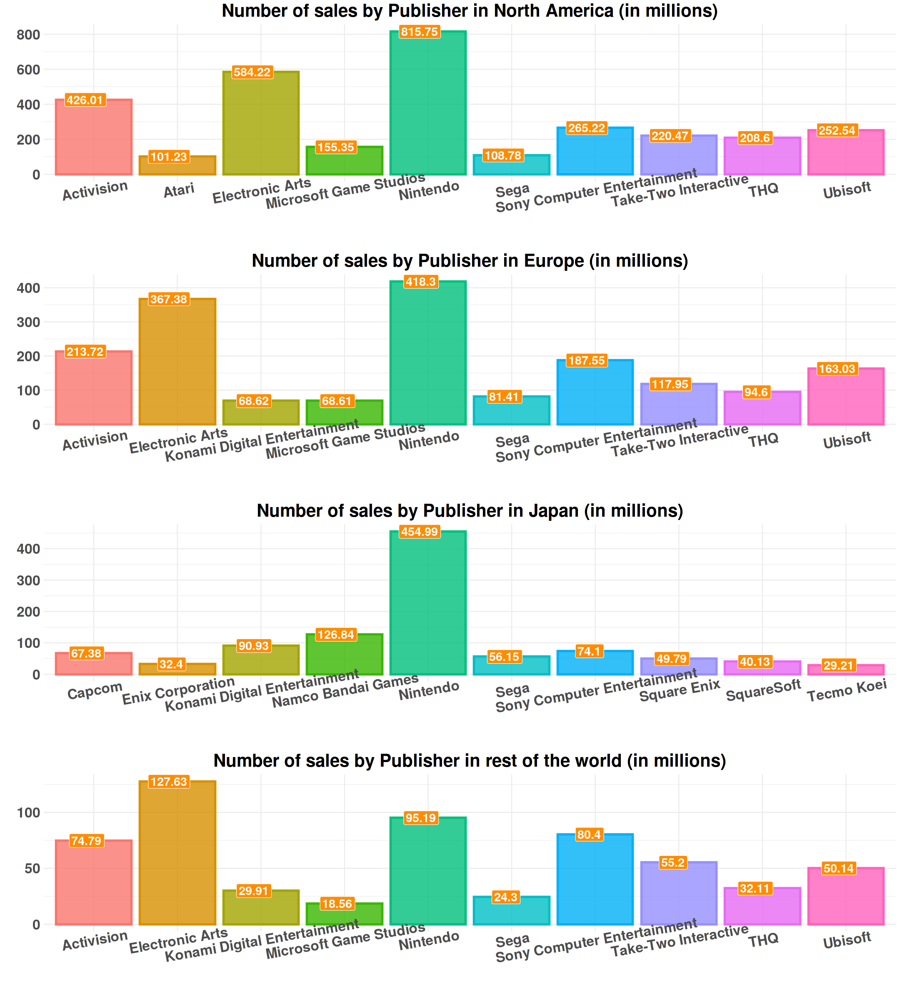

In [113]:
options(repr.plot.width = 18, repr.plot.height = 20)
a <- ggplot(data = head(pu_name_NA, 10), mapping = aes(x = Publisher, y = NA_Sales)) +
         geom_bar(stat = "identity", aes(fill = Publisher, color = Publisher), size = 1.2, alpha = .8) +
         geom_label(mapping = aes(label=NA_Sales), fill = "#FF8C00", size = 6, color = "white", fontface = "bold", hjust=.7) +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by Publisher in North America (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 10),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

b <- ggplot(data = head(pu_name_EU, 10), mapping = aes(x = Publisher, y = EU_Sales)) +
         geom_bar(stat = "identity", aes(fill = Publisher, color = Publisher), size = 1.2, alpha = .8) +
         geom_label(mapping = aes(label=EU_Sales), fill = "#FF8C00", size = 6, color = "white", fontface = "bold", hjust=.7) +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by Publisher in Europe (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 10),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

c <- ggplot(data = head(pu_name_JP, 10), mapping = aes(x = Publisher, y = JP_Sales)) +
         geom_bar(stat = "identity", aes(fill = Publisher, color = Publisher), size = 1.2, alpha = .8) +
         geom_label(mapping = aes(label=JP_Sales), fill = "#FF8C00", size = 6, color = "white", fontface = "bold", hjust=.7) +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by Publisher in Japan (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 10),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

d <- ggplot(data = head(pu_name_Other, 10), mapping = aes(x = Publisher, y = Other_Sales)) +
         geom_bar(stat = "identity", aes(fill = Publisher, color = Publisher), size = 1.2, alpha = .8) +
         geom_label(mapping = aes(label=Other_Sales), fill = "#FF8C00", size = 6, color = "white", fontface = "bold", hjust=.7) +
         xlab("") +
         ylab("") +
         ggtitle("Number of sales by Publisher in rest of the world (in millions)") +
         theme_minimal() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 10),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

plot_grid(a, b, c, d, nrow = 4, ncol = 1)

### The 10 publishers with the most sales

In [114]:
a <- c()

for(i in 1:nrow(pu_name_Global)){
    a <- c(a, i)
}

row.names(pu_name_Global) <- a
head(pu_name_Global, 10)

,Publisher,Global_Sales
,<chr>,<dbl>
1,Nintendo,1784.43
2,Electronic Arts,1093.39
3,Activision,721.41
4,Sony Computer Entertainment,607.28
5,Ubisoft,473.25
6,Take-Two Interactive,399.30
7,THQ,340.44
8,Konami Digital Entertainment,278.56
9,Sega,270.66


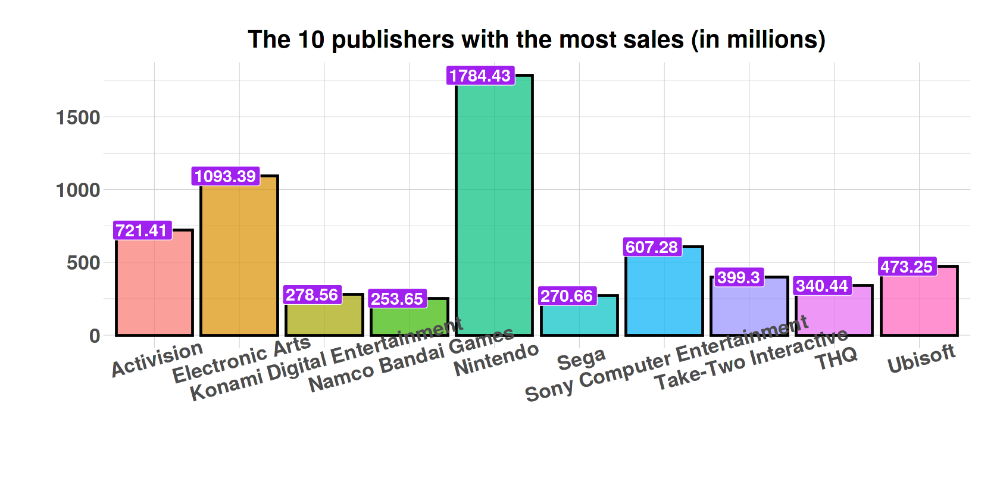

In [115]:
options(repr.plot.width = 14, repr.plot.height = 7)
ggplot(data = head(pu_name_Global, 10), mapping = aes(x = Publisher, y = Global_Sales)) +
         geom_bar(stat = "identity", mapping = aes(fill = Publisher), alpha = .7, size = 1, color = "black") +
         geom_label(mapping = aes(label=Global_Sales), fill = "purple", size = 6, color = "white", fontface = "bold", hjust=.7) +
         ggtitle("The 10 publishers with the most sales (in millions)") +
         xlab(" ") +
         ylab("") +
         theme_ipsum() +
         theme(
               plot.title = element_text(size = 24, hjust = .5, face = "bold"),
               axis.title.x = element_text(size = 24, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 24, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 20, face = "bold", angle = 15),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

In [116]:
pu_top_10 <- data[data$Publisher == "Nintendo" | data$Publisher == "Electronic Arts" | data$Publisher == "Activision" | data$Publisher == "Sony Computer Entertainment" | data$Publisher == "Ubisoft" | data$Publisher == "Take-Two Interactive" | 
                  data$Publisher == "THQ" | data$Publisher == "Konami Digital Entertainment" | data$Publisher == "Sega" | data$Publisher == "Namco Bandai Games", ]
pu_top_10$Year <- as.numeric(levels(pu_top_10$Year))[pu_top_10$Year]

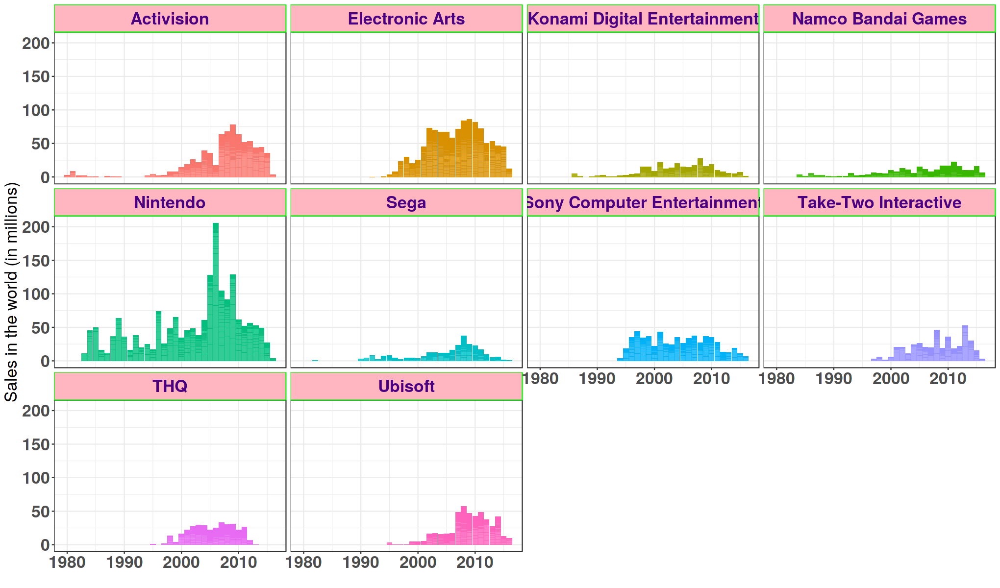

In [117]:
options(repr.plot.width = 17, repr.plot.height = 10)
ggplot(data = pu_top_10, mapping = aes(x = Year, y = Global_Sales)) +
    geom_bar(stat = "identity", mapping = aes(fill = Publisher, color = Publisher), size = .1, alpha = .8) +
    facet_wrap(~Publisher) +
    theme_bw() +
    xlab("") +
    ylab("Sales in the world (in millions)") +
    theme(
          legend.position = "none",
          strip.text.x = element_text(margin = margin(7, 7, 7, 7), size = 20, face = "bold", color = "#4B0082"),
          strip.background = element_rect(fill = "#FFB6C1", color = "green"),
          plot.title = element_text(size = 22, face = "bold", hjust = .5),
          axis.text.x = element_text(size = 20, face = "bold"),
          axis.text.y = element_text(size = 20, face = "bold"),
          axis.title.y = element_text(size = 20))

In [118]:
ggplot(pu_top_10, aes(Year, Global_Sales, colour = Publisher)) +
    geom_point(alpha = 0.7, show.legend = FALSE) +
    scale_size(range = c(2, 12)) +
    scale_x_log10() +
    facet_wrap(~Publisher) +
    # Here comes the gganimate specific bits
    labs(title = 'Year: {frame_time}', x = 'Year', y = 'Sales in the world') +
    transition_time(Year) +
    ease_aes('linear')

<img src="data:image/gif;base64,R0lGODlh4AHgAfcAAAICAgwMDBQUFBwcHCQkJCsrKzMzMzw8PENDQ0xMTFRUVFtbW2RkZGxs
bHR0dHx8fPd2bvh2bfh8dTu3BD64CD24B0W6EU++HgG/fWjDQKSlAaqsFK+wINyhK96pQ9+r
SOKsQ+SxTfeCeuK9duO/eIjOao7Sb5PSeMDAXsLDZMTFa/x6xOdv8+d08+h29Ol49RLChh/G
jC7HkmbSrGnXsHTUswGw9gyz9gKw+Bi39yvIzSbGyzvL0ELMz0bN0UrP03fV2HfU2FrK83fP
8X/Q8YODg42NjZSUlJubm6SkpKqqqrKysry8vPSjn/Syrfayrq3ZmIXavc7OhdXVmePDg9zc
qubRpvDVoejYusnivpaQ/5mU/p6Z/qKd/Kah+6+r+by49vqFyfuMzPqt2fWn1PO42sK/9emx
7umj8PCk+PC49pTbwoHX2qXdyLDgz6/m07bi0rri1K7f4bHd7bHg4azl54vT78TExMvLy9TU
1NnZ2e7QzfHC3fPRz9Pjzdbwys/l3tvp1Ovj3Ofl2Nzb79HP+d3c+MfE9OnI7fDK4O/S4urU
7OHf7uzd6fLO9szn6Nfv593n7NXn6uTk5O3j5uPj7eXq6evr6+ro5vT09P////v78+/r7wAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwA
AAAA4AHgAQAI/gA1CRxIsKDBgwgTKlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJ
kyhTqlzJsqXLlzBjypxJs6bNmzhz6tzJs6fPn0CDCh1KtOhEBwIyDbwU4IjRp1CjSp1KMtMA
BwMZGOiIpMHAOwcCGGAiEE/YAkkEYkIglizVt3Djyu2oBIAeTXkA3Il4SelBPA8EeNWEScCR
S0kCYNo0oMEkJADyaDLQABOSAJfmat7MuXPBBAk0IWAgUA9bAkgELikQYEARTZcM6yXwwCAS
BgUGI9kqUEERQgAwCUSd1+8Bp56TK19eVE8AB4o1MS5yiUmAJZsCGLm0xO4lAAom/mlSggdh
g8FHDgxcQJqAg0tKAuhRUmDgeeb48+u/WQSAEdX1CfRAA5tIhlcAeHwn3kIMDOacEpx0p4Am
WQBg4WvpDfTAhPt16OGHJukRnEBGtCbAAAMsoMkRCBigAILfbcLQfQLRF0ACCzSQRwBKXHIH
WvTZNxiIRBZpZEWTjDgeb7BVJ4CBAiQIQEM0ZiKcQAggYQQCAxWRAB4BGIfckWSWaWZBIl4Z
2xGZ3CGAEkkMMMkl/fUIgIyaLGGgQQ2qBUASlyCRFJhJYMJEAU4Z8MAm8WV25qOQEpnklZqY
FQABTmWigAAEGGEEAUniSZt5Q64WAAIGLmHApa9pMgkC/gIUsFektNZq66245qrrrrz26uuv
wAYr7LDEFmvsscgmq+yyzDbr7LPQRivttNRWa+21J+mh7bbcduvtt+CGK+645JZr7l1onqvu
uuy22+6CA7kr77z0umtQvfjmq++2jpY0yb7h5gHwwODeS/DBCINLaWkJiytww/UaDPHEA/dL
EsUHP1yuxupKjPHH9C6sCcgk0+txuxyXnLDFI/07bsoql3xyzDSHy3LN+MKs78w4Z8wuyyK5
3PPQ3PJMdM3wMnz00UYvrTLQIcmrs9Mmp7vt1FdTfbDI5mKtNbdej9v01/t6DTVIE+MIbhFG
cMu2222rPPa5q4GWABNGIBE2/rlvf6t2t3uvK3IeCiAxb9/0gcZAHn1v2zi3eQucuAJ3B65t
yo+v23R6AuOhAL27JUCZuUcc0S3bDysBGgJLEHz2R0IfjAcCB6SsxANko0sQvkswcHXe4d6u
LR7tzl77tngoUQTALDMQN+8NaPvA8uAmQf22wOvRe/C4e5uH9fs2vVvbdywAOu55HMBEuUcY
Du4dCBDPhAGWq/u6RxAb8QADSejhuQL7Q4ADkBA/PQDwCEtYgAI8dYT/Lc4I51lA/exltW9Z
bnvYQ4LnErC4OygAgAsQIHscqAcINkCCefMgALd1hP317wgKYEAIYbhAfLGsew7MgwklWD4F
SPAI/g1agAMWoCXTac93/ktAChNAuSTkLYRK+KDvsodBbe0wDyFcghR1yB4oftB8ebuiEYLo
AAZokHK+O0IE/RIvcCHhAQfAgwd7OEUyElGFDiChtt6oB/jlwYML+OF5FJAHJjAxAQ3cYvYe
YMQ+9lGBP7TjGTmYhwQucGr360jsCKYAJtxGDwME5RvzVoQjEC5vA8zDEVBpygY40QF6eED/
EjY3c9UNNHjI2wMMV8pQOiAJD4BgHhiphwZoCZaybJ8rQfmwTn4Sgnqw3i5ViS9LFASWoDSd
MY+AzCQsQQl6WAATjlCEPNwNDwugIhJNk7dlJsCJSACmElrXSSoWwG46/uwmMIlZSmEqbwmt
W8AdjLBKBxDil+Q0DRPKx8+CxnJWbfwWEoqQhAZ47pvhdENCz6mAX4KyAdqcZegOIMFvYnGg
3eRfOJEA0HAO1IgNACcSKMcEjIqTnOZc6AJ2GUtu6q2R3sokRxqGBwIsIAEFIBzxosk2JJRv
lQQtXwK0hARx6oGcBNUDRekVtlqWq4olvA17+KeAO2jLelm1KjlLp1UnwtCsyCPAB5Oa1dtJ
1X2AW1fSNJGAgK5volml6B0adIA7tE8PCcjDKd23hOglMW8KIN4vCaq8LBD2pdoCK1spqjwZ
MoB/WQXmYLWSBYIGNgmHTYD/uvhZt2rVLRH1/tZEDZiEsn5WfZFLLOHKqi21ljOa3bvjZU/7
Ja069bYDdR8xteUAJQy2AepLrWJjONYk3NVmJ9kkwLjZWyUYU5SMNB2O8NC+I9whDwhApeEG
GLmtem9nFZSXEtYZ1mDqAQlMWOYA2WY6B/S3iG1tZ//yeFVsLgC1hrOeedOHr70yAVWhNCbw
KOrOcZryc6c0IganlzeVKgCe1ospYvHGWPqeVppGyAN+gRdicN6tvLxErekIiUX7rth0RYCo
0mS7PCYcQAEx3cOLDUdjIA/YjKLcY/d2KeK7TTgJDAAnEZtMYm35uHMG8K6Lx0lkxe7UdPhd
MKrAJdSNaHdfCmjd/n0b4MEEOODB/tXq59pXWyGWDpA/NJ0R1Iwwr5JLCS5iIjz/F702v1mA
hssh8IyghKh+0LFp3iNITffgIviwe/Taayxz7EPzHZbRUfwsI7ucB+cx9p6UXKICG32EBxvB
hwwIphHp88F3LloJD9YikMOqB1fDOrybXQJbCYkHiz66hHouz+7cSD0HKCCK7AkvYhXLZsrl
cYt7NAATlwftWN/akDFEQrdlva0kIMCHe4Z2A6RNY2Pn6HuBxOa3yqyRc00wd+fyM7s4lrJ7
c9VdXFOXv6NpXd7ie1v63hYhLMjwmgkMZnujd0YOHrOEU1xfAW8Y41xJiIHLLb4XR9m6/iSO
kTPbu2f+DpzFQ16vm4EL4iyPGMhjjjCSXwRgHtdXzr+1cpoDfOYix9nOeQ50h/fM5hYxuc/m
1e+AnfxyVzuZxnY+NZ2FbeoYy3

In [119]:
npu_top_10 <- data[data$Publisher == "Nintendo" | data$Publisher == "Electronic Arts" | data$Publisher == "Activision" | data$Publisher == "Ubisoft", ]
npu_top_10$Year <- as.numeric(levels(npu_top_10$Year))[npu_top_10$Year]

In [120]:
ggplot(data = npu_top_10, aes(x=Year, y=Global_Sales, group=Publisher, color=Publisher)) +
    geom_line() +
    geom_point() +
    ggtitle("Sale of games by Publisher from 1980 to 2016 (in millions)") +
    theme_ipsum() +
    ylab("Sale of games") +
    xlab("") +
    transition_reveal(Year) 

<img src="data:image/gif;base64,R0lGODlh4AHgAfYAAAEBAQwMDBMTExsbGyMjIywsLDQ0NDw8PEREREtLS1RUVFtbW2NjY2tr
a3Nzc3t7e/d2bPh2bfd6cXyuAIm2Go25Ipa+MpnAOPeCebbSccd8/wC/xA3CxxHDyCPIzCnJ
zUbR1GbZ3IODg4uLi5KSkpubm6Ojo62trbOzs7u7u/iIgPeQhvOSivqfmfqim/uspvyxrfu1
sfq6s/y/u8zfm87hn9fmsdnntNei/9il/96x/+C2/+G5/6bp6qnp68PDw8vLy9TU1Nvb2+3P
zfzFwf3Z1+XvzOfw0e3z2+XD/+fI/+3V/8Lv8cbw8tP09d329+bm5uzs7P7o5//s6/f67+D3
+O36+/X19f/29fj78vjw//D7/P///wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwAAAAA4AHg
AQAH/oBcgoOEhYaHiImKi4yNjo+QkZKTlJWWl5iZmpucnZ6foKGio6SlpqeoqaqrrK2ur7Cx
srO0tba3uLm6u7y9vr/AwcLDxMXGx8jJysvMzc7P0NHS09TV1tfY2drb3N3e3+Dh4uPk5ebn
6Onq6+zt7u/w8fLz9PX29/j5+vv8/f7/AAMKHEiwoMGDCBMqXMiwocOHECNKnEixosWLGDNq
3Mixo8ePIEOKHEmypMmTKFNyM2EgwAAFUBYBABDFEhQEARbYggJAwKQBM2cOeHBFEU+fhmbG
VIroysxMN3OO+gGgwaArDQYQcFCUC9YBAhbEFPSgQAAFNQsZAJDiUZQF/gIGNOjKpWzOsYKo
Wh1EwuwBIIeEABjBhammAACW0iy8GDHeSw4CPGYmIuhMAZMLzUxLycFMBTsBBPhpeaYDo6IP
bebiuOlTTA1m6gx1BUHVQQks711g2UDRB5YRGFr749GB4GSRC6p9W9AIywPoDlKQmHV1TUxX
r26dKUjzZlcQM0BhAuheRIYp5RYhXdZR0iKApKAOoD2h94ZaX0lr3ymATLaNYN8mByDWHBAz
pfCDADT5dwIUDAJxBYMnBIEYYIQQ5wiCAaSAAmI/TAhAhYgFwUWBM+0lYgpCFAAACoV4l4Ag
UXCWSY2CaLfYfpy4mBkyCBIwiAkAGCCIEAoI/hDAXznumNUACwxoQoEGmCAIAUHNWIgDAxiA
gotCcIGkkggUx9MAPxgwAHtJIhCmVw0QAGVaUCQZAAIm3icaEAYIwEBRtp3GBZEFFALUCcvN
FIR/idZ3FJ9+dqVjTXUKIEACJvoHRIEwLRdnWDVFAcAAQaxJCJYzJSDqAEAQIIIgUy5pJRer
prnmFQrc+SYhuglSAgDCcUGdCd4JKeyIKRQpCHUlnBqUoLFWacivWuZWQrJGHksCYykKgq0i
sc2qlFMCBIFTApPVqiabArjZZEyI1TQprFTOSm4QnI5Vabt5VkZYMwiytRyPXKwVlADyLmZb
UIUWQkJphCWA2FZb/gYVQIkFWybAfj0NYCCKABwgyMIzNWzwTARIx9OoQen0nMhcxCboIIc2
uuhrjF2xMlCyNZlwTCePeoV/qAIwG8kAFCqqAGu9itvEDizdNBcPW0YYTwEQwGCRHyNS2V6e
CVoZUTMBAQVQQfwKWswAMECIxAAQQNivVheSQgOIHjuC2oLE5rYgX/sKgAIFulsIg5I2KJrW
PRMiatYfd21dwpQzFhPdQRFGLuODCxJ0ylx41zAzIo46XleCBQCEEAy2FS9VAfwARM1XMehA
EMAFAOiIhYRnNAoGC5E6EEG0LioAVh6HcMBQwC47UCh4N0CNQBU3yMoI3K2Ud/Vl3BYh/jVf
8Vx9/hXlXxQrH6B9dfEyFoVg058NQIipApE7F87P/uLKBJSQ5yC2QRT//BcF29mvJxwb0RWU
dwXmHSJwXHhOsHjzJ8wB4DSV+Vtl1jaItbTFd7fL3YC4ACG2PEeDnQNcc4ADHenAbxDx8s9p
TpAaPfFOeVEIWOXmtRkQ4k40QzMNF2g4GunprHqCQMwIjdEqjbUFCiYojhCwhKiZXKEyswHO
ebiAgrgNAkswCmAhYFeUgAkBCidoyxRHdLyieGZtDPphFqsSsBFAAQpBsNHK3oQlKyERiIYq
Tdu88pryrWwsfXSf++p4x0X5J0wruwJw5tiA42GoEGJcGYa6/mgsLrjoBMeryRuTCIBLEgKC
XQxAEIrXOc8EBQGSbM6vgtVBgXHyiy86xAK9qEXBaYkLEPRMh1jZrEHQkJY9ZEokHbeaUVoH
MO3LTmNocktBfNI/MYkkI/GYFhdZzxn2cxEC8ZekoFSRJrwpzS+plkIu8IYwYiQEkWDGmDD9
oJwzAeVrIIg2BggyAVcoWgHydr2eDII3r/LnCKhCS5qpsyaMapLODLosALxqUgFlGKLK5zN/
PtSKhxDj8fjSzneOFJjNwdL/TvkdcbYMdkA4AWJI8Jy1PWw2tSzOwzj4TkNcITexQ+nanoNT
CEpQELyZGTs5mMz/+IyZToWgSi03/rmqbman0xlMRN2X0ZIRdC0EVUYUgoCXFIBICIjJySfd
588CKOCtCngAIbCK1MFwIZ5DChkMARAEwYhmAZ9cmQr3AhQgtBWucSXhAgyUy4IixZ12JZIC
nvMv8FlUdnjhqCEpClnCRHMxUFhsUFCwVSseFq4PEGxIeXfSpR50MI8brCAK+8DvQEFiBpDZ
w7TkzwX8CmYQzKlr61rZ5RwnqFz4rWyX+ytBnZAQRB3EuHAG0kGclJ+lVCQPaULXzpYWtHAZ
7ciQ14xqCiKOlTFATMS4GSwuBwrSMe9a8ZoXoZFwJkJIb00CGFGp8tW9XonCFYQQPS6kYC1b
PKQ1ybs0/t6sdLa8SwporahgT5JXR1AQQgpMlAIX/Ym6NAHwfhKICJHiTL4jUq1/H7xc6fiz
BJUJlmcWkCxj9TRDtvTigsPKtnINosbEHQQEqbI2hM4VAL9sqnQXY919ppSv2p2mYqKA4hN8
d8AbvsKBB5kxHiNjZTQ+AXV0Bxy3FZB3m6GKAH4ghOMU98wPCEJlArDfCF8FMXHODV/LTCsK
XffJQOAQm91MpAHAN6k2hMn4xrIWlxyCdocjLwsnajQhLDrKUSj0oQFANqe6z3lCWMsIWotJ
3qm2z5z+oWT+TNjsGgKCCBKAEICAuC6Wco0lEFH0GLQrz7GWQXGesx5nUoJA/ptN16zcVXCV
hALWCSyvyFScp6srCKwtF0uAwXDOchYFPMtZNPAFcaZHtWm5Wvh7lBFks1LJAMY1azVIm14h
xpe58XrZlaJBDIFF024GlUDFgOaCnoVCvdKsdGWW+VtdGhdIL0O2JwRQIsKD8rdJRYFnQbnZ
tLs38FGhD2elRhSpq1bv/j6ZxSg9z3Ge5ZWgRWfhWTLEwl5F75kUN4KCxKBl1hncmtPzSDrm
qrihem0ob2cx0qwJyW1OyI0f0TKq9IoSnzElS2VvEA4QQP8eMIDTrAYrEcfTIVgSAGnZ26dc
IsAJGBSTrG+966y+0gDCBPY75SkICVCS+gpxphMU/iBSg6AKeQ0B6ftI7AAWctSo/A54TIcu
70sqzpXhFPYwkZoQJvY0rFpygFnFnQtyQnlw6xSAAjiNVgwAS6fIIqcoGQIFQIFWS8xOiNiU
xtwP0NqfWLpFEfzd9ZFOXLg97RKVOXkvoXf8vAY1e3vhrPiP1/v3BDM6gnB0FtdXSSjCpQzK
CmRlVq5MJ2Nxhe5qHxQyUsZafsSPjgOgmLJYmMPPz4ncsB8Y3lF4QMA+gM7X4lxLRH/dYVfH
EBn3J4AImIAKuIAM2IAO+IAQGI

## E. Global Sales Number per Year

<a id="y"></a>

In [121]:
df_global <- aggregate(list(Global_Sales = data$Global_Sales), list(Year = data$Year), sum)
df_global <- df_global[order(df_global$Global_Sales), ]

a <- c()

for(i in 1:nrow(df_global)){
    a <- c(a, i)
}

row.names(df_global) <- a
df_global

,Year,Global_Sales
,<fct>,<dbl>
1,1980,11.38
2,1983,16.79
3,1987,21.74
4,1982,28.86
5,1991,32.23
6,1981,35.77
7,1986,37.07
8,1993,45.98
9,1988,47.22


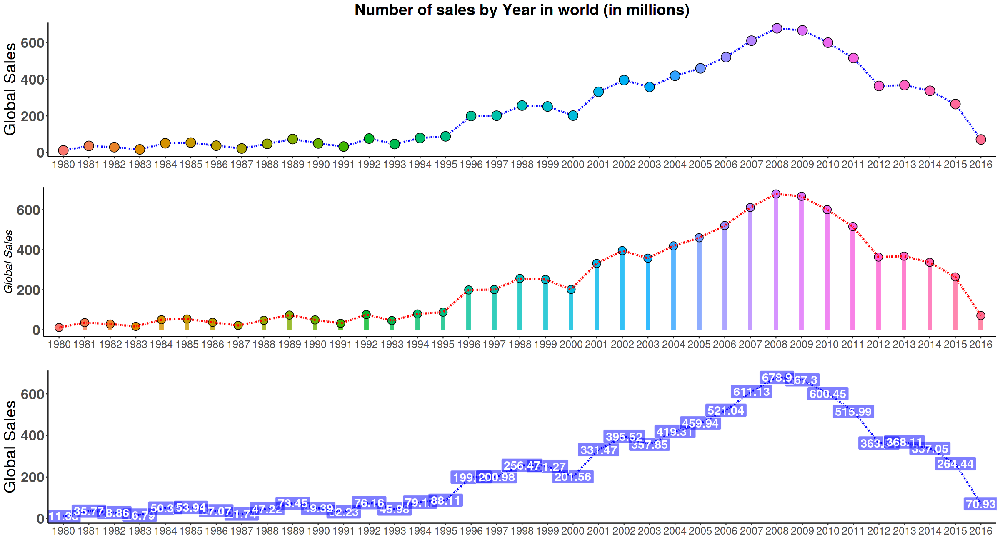

In [122]:
options(repr.plot.width = 20, repr.plot.height = 11)
a <- ggplot(data = df_global, mapping = aes(x = Year, y = Global_Sales)) +
         geom_line(size = 1, linetype = 10, color = "blue", group = 1) +
         geom_point(size = 6, shape = 21, mapping = aes(fill = Year)) +
         xlab("") +
         ylab("Global Sales") +
         ggtitle("Number of sales by Year in world (in millions)") +
         theme_classic() +
         theme(legend.position = "none",
               strip.text.x = element_text(margin = margin(7, 7, 7, 7), size = 20, face = "bold", color = "#4B0082"),
               strip.background = element_rect(fill = "#FFB6C1", color = "green"),
               plot.title = element_text(size = 22, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15),
               axis.text.y = element_text(size = 20, face = "bold"),
               axis.title.y = element_text(size = 23))

b <- ggplot(data = df_global, mapping = aes(x = Year, y = Global_Sales)) +
         geom_segment(aes(xend=Year, yend=0, color = Year), size = 2.3, alpha = .8) +
         geom_point(mapping = aes(fill = Year), size = 5, shape = 21) +
         geom_line(group = 1, size = 1.1, linetype = 10, color = "red") +
         xlab("") +
         ylab("Global Sales") +
         theme_classic() +
         theme(plot.title = element_text(size = 25, face = "bold", hjust = .5),
               axis.title.x = element_text(size = 16, hjust = .5, face = "italic"),
               axis.title.y = element_text(size = 16, hjust = .5, face = "italic"),
               axis.text.x = element_text(size = 15),
               axis.text.y = element_text(size = 20, face = "bold"),
               legend.position = "none")

c <- ggplot(data = df_global, mapping = aes(x = Year, y = Global_Sales)) +
         geom_line(size = 1, linetype = 10, color = "blue", group = 1) +
         geom_label(mapping = aes(label=Global_Sales), fill = "blue", size = 6, color = "white", fontface = "bold", alpha = .5) +
         xlab("") +
         ylab("Global Sales") +
         theme_classic() +
         theme(legend.position = "none",
               strip.text.x = element_text(margin = margin(7, 7, 7, 7), size = 20, face = "bold", color = "#4B0082"),
               strip.background = element_rect(fill = "#FFB6C1", color = "green"),
               plot.title = element_text(size = 22, face = "bold", hjust = .5),
               axis.text.x = element_text(size = 15),
               axis.text.y = element_text(size = 20, face = "bold"),
               axis.title.y = element_text(size = 23))


plot_grid(a, b, c, ncol = 1, nrow = 3)